<a href="https://colab.research.google.com/github/hubcborja/Trabajo_grado_ECIJG/blob/main/MLEA_IvHubMetrics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<p align="center">
  <img src="https://www.dropbox.com/scl/fi/fqv8wxrh2fzpp9nudoum8/LogoEscuela.png?rlkey=g2keqeitv28yzatqs75odkqbq&st=k1urhxs6&dl=1" alt="Logo Escuela" width="200">
</p>

#Machine Learning Methods Applied to Real-World Data Coursework for the Machine Learning class, Data Science Master's Program, Escuela Colombiana de Ingeniería Julio Garavito. Bogotá D.C.


**Profesores:** <br>
Ivan Olier Caparroso <br>
Mario Julian Cañon Ayala <br>


**Estudiantes:** <br>
Huber Camilo Borja Amaya <br>
Ivonne Elena Linares Cortés <br>


**2025 Semestre 2**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
pd.set_option('display.max_columns', None)

In [ ]:
from sklearn.svm import SVC
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    confusion_matrix,
    classification_report, log_loss,
    roc_auc_score,
    roc_curve, auc, accuracy_score, precision_score, recall_score, f1_score, RocCurveDisplay, PrecisionRecallDisplay, ConfusionMatrixDisplay
)

from sklearn.metrics import RocCurveDisplay

from sklearn.preprocessing import label_binarize


from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc as auc_function # Alias para evitar conflicto de nombres

from numpy.random.mtrand import random


## Importación de datos y estadísticas

In [ ]:
# Conexión con las tablas de trabajo subidas a Github

base = 'https://raw.githubusercontent.com/ivonnelinares10-prog/2025_II_MLAceleradores/main/'

metadata = pd.read_csv(base + 'metadata.csv')
metadata_kaggle = pd.read_csv(base + 'metadata_kaggle.csv')
metadata_test = pd.read_csv(base + 'metadata_test.csv')
predictions_sample = pd.read_csv(base + 'predictions_sample.csv')
signals = pd.read_csv(base + 'signals.csv')
signals_kaggle = pd.read_csv(base + 'signals_kaggle.csv')
signals_test = pd.read_csv(base + 'signals_test.csv')

In [ ]:
signals_test

,user_snippet,x-axis,y-axis,z-axis,timestamp
0,3006_0,-8.58,1.65,-2.83,0.0
1,3006_0,8.81,12.45,5.90,50.0
2,3006_0,16.40,15.98,1.69,100.0
3,3006_0,-3.21,9.34,5.79,150.0
4,3006_0,-4.33,15.89,-7.44,200.0
...,...,...,...,...,...
193268,3362_325,-18.24,-3.30,0.08,4750.0
193269,3362_325,-9.70,-0.42,0.50,4800.0
193270,3362_325,-19.61,4.52,-0.15,4850.0
193271,3362_325,-16.78,9.38,-11.54,4900.0


In [ ]:
print(metadata.head())

  user_snippet  x-axis__sum_values  x-axis__median  x-axis__mean  \
0        525_0             -247.31          -1.805       -2.4731   
1        525_1              566.93           5.595        5.6693   
2        525_2             -568.61          -5.305       -5.6861   
3        525_3             -137.60          -1.990       -1.3760   
4        525_4             -583.99          -5.000       -5.8399   

   x-axis__length  x-axis__standard_deviation  x-axis__variance  \
0           100.0                    4.379826         19.182875   
1           100.0                    2.906785          8.449399   
2           100.0                    6.393058         40.871192   
3           100.0                    3.538268         12.519340   
4           100.0                    6.513692         42.428177   

   x-axis__root_mean_square  x-axis__maximum  x-axis__absolute_maximum  \
0                  5.029821             7.31                     12.41   
1                  6.371057            1

In [ ]:
metadata_kaggle.head()

,user_snippet,x-axis__sum_values,x-axis__median,x-axis__mean,x-axis__length,x-axis__standard_deviation,x-axis__variance,x-axis__root_mean_square,x-axis__maximum,x-axis__absolute_maximum,x-axis__minimum,y-axis__sum_values,y-axis__median,y-axis__mean,y-axis__length,y-axis__standard_deviation,y-axis__variance,y-axis__root_mean_square,y-axis__maximum,y-axis__absolute_maximum,y-axis__minimum,z-axis__sum_values,z-axis__median,z-axis__mean,z-axis__length,z-axis__standard_deviation,z-axis__variance,z-axis__root_mean_square,z-axis__maximum,z-axis__absolute_maximum,z-axis__minimum
0,8054_0,880.46,8.560,8.8046,100.0,5.146708,26.488599,10.198509,19.53,19.53,-1.04,517.84,4.615,5.1784,100.0,3.806477,14.489265,6.426904,17.24,17.24,-2.49,-6.605867,-0.762740,-0.066059,100.0,3.058799,9.356253,3.059513,9.615966,9.615966,-9.152874
1,8054_1,552.88,5.520,5.5288,100.0,0.039173,0.001535,5.528939,5.63,5.63,5.43,251.05,2.530,2.5105,100.0,0.028333,0.000803,2.510660,2.56,2.56,2.45,823.670000,8.240000,8.236700,100.0,0.037445,0.001402,8.236785,8.310000,8.310000,8.120000
2,8054_2,848.84,8.045,8.4884,100.0,4.789062,22.935113,9.746181,19.57,19.57,-1.50,528.33,4.805,5.2833,100.0,3.656953,13.373308,6.425462,14.29,14.29,-2.79,-7.995144,-0.211115,-0.079951,100.0,3.178891,10.105348,3.179896,9.656827,9.656827,-7.014479
3,8054_3,100.93,0.990,1.0093,100.0,0.044525,0.001983,1.010282,1.12,1.12,0.89,992.36,9.920,9.9236,100.0,0.020373,0.000415,9.923621,10.00,10.00,9.89,29.770000,0.310000,0.297700,100.0,0.032058,0.001028,0.299421,0.340000,0.340000,0.190000
4,8054_4,845.52,7.970,8.4552,100.0,4.858636,23.606345,9.751756,19.57,19.57,-2.45,523.32,4.770,5.2332,100.0,3.628599,13.166734,6.368133,15.51,15.51,-2.83,1.757024,-0.483522,0.017570,100.0,3.475728,12.080686,3.475773,10.310603,10.310603,-9.956474


In [ ]:
metadata_test.head()

,user_snippet,x-axis__sum_values,x-axis__median,x-axis__mean,x-axis__length,x-axis__standard_deviation,x-axis__variance,x-axis__root_mean_square,x-axis__maximum,x-axis__absolute_maximum,x-axis__minimum,y-axis__sum_values,y-axis__median,y-axis__mean,y-axis__length,y-axis__standard_deviation,y-axis__variance,y-axis__root_mean_square,y-axis__maximum,y-axis__absolute_maximum,y-axis__minimum,z-axis__sum_values,z-axis__median,z-axis__mean,z-axis__length,z-axis__standard_deviation,z-axis__variance,z-axis__root_mean_square,z-axis__maximum,z-axis__absolute_maximum,z-axis__minimum,activity
0,3006_0,190.60,1.365,1.9060,100.0,6.192680,38.349290,6.479362,19.50,19.50,-10.46,1042.50,10.895,10.4250,100.0,5.416010,29.333159,11.747927,19.57,19.57,-0.72,-73.61,-0.950,-0.7361,100.0,3.607485,13.013948,3.681819,10.19,10.19,-9.92,Walking
1,3006_1,-115.08,-2.070,-1.1508,100.0,5.779997,33.408361,5.893446,16.82,16.82,-12.49,1052.22,10.590,10.5222,100.0,5.516254,30.429053,11.880478,19.57,19.57,0.61,-13.61,-0.420,-0.1361,100.0,3.551672,12.614374,3.554279,9.47,11.75,-11.75,Walking
2,3006_2,-171.08,-1.710,-1.7108,100.0,5.347172,28.592243,5.614186,13.95,13.95,-11.69,1051.39,10.420,10.5139,100.0,5.421342,29.390952,11.829330,19.57,19.57,0.53,-13.96,-0.480,-0.1396,100.0,2.636698,6.952178,2.640391,8.35,8.50,-8.50,Walking
3,3006_3,633.38,5.790,6.3338,100.0,5.019286,25.193234,8.081476,18.77,18.77,-5.90,915.69,9.130,9.1569,100.0,4.155381,17.267191,10.055646,19.57,19.57,-1.46,26.10,-0.995,0.2610,100.0,4.298020,18.472975,4.305937,11.75,11.75,-8.35,Downstairs
4,3006_4,160.75,1.880,1.6075,100.0,5.769199,33.283657,5.988966,19.50,19.50,-7.78,1035.09,10.440,10.3509,100.0,5.305685,28.150288,11.631484,19.57,19.57,-0.61,-43.41,-0.630,-0.4341,100.0,3.324155,11.050006,3.352380,12.03,12.03,-8.27,Walking


In [ ]:
predictions_sample.head()

,user_snippet,prediction
0,8054_0,Walking
1,8054_1,Downstairs
2,8054_2,Standing
3,8054_3,Sitting
4,8054_4,Upstairs


In [ ]:
signals.head()

,user_snippet,x-axis,y-axis,z-axis,timestamp
0,525_0,1.57,-0.61,-0.65,0.0
1,525_0,-1.12,1.84,-1.46,50.0
2,525_0,5.48,14.14,-5.71,100.0
3,525_0,-12.41,10.53,-5.52,150.0
4,525_0,-1.14,10.50,2.91,200.0


In [ ]:
signals['user_snippet'].value_counts().describe()

,count
count,6310.000000
mean,99.820285
std,3.428416
min,3.000000
25%,100.000000
50%,100.000000
75%,100.000000
max,100.000000


In [ ]:
signals_kaggle.head()

,user_snippet,x-axis,y-axis,z-axis,timestamp
0,8054_0,17.67,0.84,-2.179256,0.0
1,8054_0,13.57,1.42,4.099725,50.0
2,8054_0,13.80,10.00,-3.255263,100.0
3,8054_0,11.22,13.57,-2.751310,150.0
4,8054_0,4.48,7.27,0.422231,200.0


In [ ]:
signals_test.head()

,user_snippet,x-axis,y-axis,z-axis,timestamp
0,3006_0,-8.58,1.65,-2.83,0.0
1,3006_0,8.81,12.45,5.90,50.0
2,3006_0,16.40,15.98,1.69,100.0
3,3006_0,-3.21,9.34,5.79,150.0
4,3006_0,-4.33,15.89,-7.44,200.0


In [ ]:
c_drop = [
    'x-axis__sum_values', 'y-axis__sum_values', 'z-axis__sum_values',
    'x-axis__variance', 'y-axis__variance', 'z-axis__variance',
    'x-axis__length', 'y-axis__length', 'z-axis__length'
]

metadata_limpia = metadata.drop(columns=c_drop)
metadata_limpia.columns

Index(['user_snippet', 'x-axis__median', 'x-axis__mean',
       'x-axis__standard_deviation', 'x-axis__root_mean_square',
       'x-axis__maximum', 'x-axis__absolute_maximum', 'x-axis__minimum',
       'y-axis__median', 'y-axis__mean', 'y-axis__standard_deviation',
       'y-axis__root_mean_square', 'y-axis__maximum',
       'y-axis__absolute_maximum', 'y-axis__minimum', 'z-axis__median',
       'z-axis__mean', 'z-axis__standard_deviation',
       'z-axis__root_mean_square', 'z-axis__maximum',
       'z-axis__absolute_maximum', 'z-axis__minimum', 'activity'],
      dtype='object')

In [ ]:
c_drop = [
    'x-axis__sum_values', 'y-axis__sum_values',
       'z-axis__sum_values',
    'x-axis__variance', 'y-axis__variance', 'z-axis__variance',
    'x-axis__length', 'y-axis__length', 'z-axis__length',
    'x-axis__median',
    'x-axis__standard_deviation', 'x-axis__root_mean_square',
    'x-axis__maximum', 'x-axis__absolute_maximum', 'x-axis__minimum',
    'y-axis__median', 'y-axis__standard_deviation',
    'y-axis__root_mean_square', 'y-axis__maximum',
    'y-axis__absolute_maximum', 'y-axis__minimum', 'z-axis__median',
    'z-axis__standard_deviation',
    'z-axis__root_mean_square', 'z-axis__maximum',
    'z-axis__absolute_maximum', 'z-axis__minimum'
]

metadata_limpia2 = metadata.drop(columns=c_drop)
metadata_limpia2.columns

Index(['user_snippet', 'x-axis__mean', 'y-axis__mean', 'z-axis__mean',
       'activity'],
      dtype='object')

In [ ]:
c_drop = [
    'x-axis__sum_values', 'y-axis__sum_values', 'z-axis__sum_values',
    'x-axis__variance', 'y-axis__variance', 'z-axis__variance',
    'x-axis__length', 'y-axis__length', 'z-axis__length'
]

metadata_test_limpia = metadata_test.drop(columns=c_drop)
metadata_test_limpia.columns

Index(['user_snippet', 'x-axis__median', 'x-axis__mean',
       'x-axis__standard_deviation', 'x-axis__root_mean_square',
       'x-axis__maximum', 'x-axis__absolute_maximum', 'x-axis__minimum',
       'y-axis__median', 'y-axis__mean', 'y-axis__standard_deviation',
       'y-axis__root_mean_square', 'y-axis__maximum',
       'y-axis__absolute_maximum', 'y-axis__minimum', 'z-axis__median',
       'z-axis__mean', 'z-axis__standard_deviation',
       'z-axis__root_mean_square', 'z-axis__maximum',
       'z-axis__absolute_maximum', 'z-axis__minimum', 'activity'],
      dtype='object')

In [ ]:
c_drop = [ 'x-axis__sum_values', 'y-axis__sum_values',
       'z-axis__sum_values',
    'x-axis__variance', 'y-axis__variance', 'z-axis__variance',
    'x-axis__length', 'y-axis__length', 'z-axis__length',
    'x-axis__median',
    'x-axis__standard_deviation', 'x-axis__root_mean_square',
    'x-axis__maximum', 'x-axis__absolute_maximum', 'x-axis__minimum',
    'y-axis__median', 'y-axis__standard_deviation',
    'y-axis__root_mean_square', 'y-axis__maximum',
    'y-axis__absolute_maximum', 'y-axis__minimum', 'z-axis__median',
    'z-axis__standard_deviation',
    'z-axis__root_mean_square', 'z-axis__maximum',
    'z-axis__absolute_maximum', 'z-axis__minimum'
]

metadata_test_limpia2 = metadata_test.drop(columns=c_drop)
metadata_test_limpia2.columns

Index(['user_snippet', 'x-axis__mean', 'y-axis__mean', 'z-axis__mean',
       'activity'],
      dtype='object')

In [ ]:
c_drop = [
    'x-axis__sum_values', 'y-axis__sum_values', 'z-axis__sum_values',
    'x-axis__variance', 'y-axis__variance', 'z-axis__variance',
    'x-axis__length', 'y-axis__length', 'z-axis__length'
]

metadata_kaggle_limpia = metadata_kaggle.drop(columns=c_drop)
metadata_kaggle_limpia.columns

Index(['user_snippet', 'x-axis__median', 'x-axis__mean',
       'x-axis__standard_deviation', 'x-axis__root_mean_square',
       'x-axis__maximum', 'x-axis__absolute_maximum', 'x-axis__minimum',
       'y-axis__median', 'y-axis__mean', 'y-axis__standard_deviation',
       'y-axis__root_mean_square', 'y-axis__maximum',
       'y-axis__absolute_maximum', 'y-axis__minimum', 'z-axis__median',
       'z-axis__mean', 'z-axis__standard_deviation',
       'z-axis__root_mean_square', 'z-axis__maximum',
       'z-axis__absolute_maximum', 'z-axis__minimum'],
      dtype='object')

In [ ]:
c_drop = [
  'x-axis__sum_values', 'y-axis__sum_values',
       'z-axis__sum_values',
    'x-axis__variance', 'y-axis__variance', 'z-axis__variance',
    'x-axis__length', 'y-axis__length', 'z-axis__length',
    'x-axis__median',
    'x-axis__standard_deviation', 'x-axis__root_mean_square',
    'x-axis__maximum', 'x-axis__absolute_maximum', 'x-axis__minimum',
    'y-axis__median', 'y-axis__standard_deviation',
    'y-axis__root_mean_square', 'y-axis__maximum',
    'y-axis__absolute_maximum', 'y-axis__minimum', 'z-axis__median',
    'z-axis__standard_deviation',
    'z-axis__root_mean_square', 'z-axis__maximum',
    'z-axis__absolute_maximum', 'z-axis__minimum'
]

metadata_kaggle_limpia2 = metadata_kaggle.drop(columns=c_drop)
metadata_kaggle_limpia2.columns

Index(['user_snippet', 'x-axis__mean', 'y-axis__mean', 'z-axis__mean'], dtype='object')

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
#Training set
acceledata = metadata
print(acceledata.shape)
acceledata.head()

(6310, 32)


,user_snippet,x-axis__sum_values,x-axis__median,x-axis__mean,x-axis__length,x-axis__standard_deviation,x-axis__variance,x-axis__root_mean_square,x-axis__maximum,x-axis__absolute_maximum,x-axis__minimum,y-axis__sum_values,y-axis__median,y-axis__mean,y-axis__length,y-axis__standard_deviation,y-axis__variance,y-axis__root_mean_square,y-axis__maximum,y-axis__absolute_maximum,y-axis__minimum,z-axis__sum_values,z-axis__median,z-axis__mean,z-axis__length,z-axis__standard_deviation,z-axis__variance,z-axis__root_mean_square,z-axis__maximum,z-axis__absolute_maximum,z-axis__minimum,activity
0,525_0,-247.31,-1.805,-2.4731,100.0,4.379826,19.182875,5.029821,7.31,12.41,-12.41,824.44,8.805,8.2444,100.0,6.756690,45.652857,10.659408,19.50,19.50,-3.79,-221.780000,-1.440000,-2.217800,100.0,3.088071,9.536183,3.801949,2.91000,12.95000,-12.950000,Jogging
1,525_1,566.93,5.595,5.6693,100.0,2.906785,8.449399,6.371057,14.10,14.10,-0.95,824.65,8.390,8.2465,100.0,2.530549,6.403677,8.626033,13.21,13.21,3.45,122.351584,-0.251976,1.223516,100.0,4.499906,20.249155,4.663276,14.47843,14.47843,-5.053149,Walking
2,525_2,-568.61,-5.305,-5.6861,100.0,6.393058,40.871192,8.555871,8.62,18.24,-18.24,736.43,6.435,7.3643,100.0,6.799682,46.235681,10.023402,19.31,19.31,-4.99,56.390000,0.950000,0.563900,100.0,5.376821,28.910208,5.406310,12.79000,15.75000,-15.750000,Jogging
3,525_3,-137.60,-1.990,-1.3760,100.0,3.538268,12.519340,3.796408,8.89,9.70,-9.70,778.99,7.830,7.7899,100.0,7.468088,55.772343,10.791426,19.57,19.57,-4.52,-361.040000,-2.775000,-3.610400,100.0,3.235463,10.468218,4.848011,1.80000,10.88000,-10.880000,Jogging
4,525_4,-583.99,-5.000,-5.8399,100.0,6.513692,42.428177,8.748292,6.51,18.96,-18.96,472.93,4.120,4.7293,100.0,5.761811,33.198469,7.454176,19.27,19.27,-6.82,-445.670000,-3.375000,-4.456700,100.0,5.149686,26.519264,6.810392,7.40000,15.83000,-15.830000,Jogging


In [ ]:
acceledata.dtypes

,0
user_snippet,object
x-axis__sum_values,float64
x-axis__median,float64
x-axis__mean,float64
x-axis__length,float64
x-axis__standard_deviation,float64
x-axis__variance,float64
x-axis__root_mean_square,float64
x-axis__maximum,float64
x-axis__absolute_maximum,float64


In [ ]:
print(acceledata.describe(include='all'))

       user_snippet  x-axis__sum_values  x-axis__median  x-axis__mean  \
count          6310         6310.000000     6310.000000   6310.000000   
unique         6310                 NaN             NaN           NaN   
top         954_253                 NaN             NaN           NaN   
freq              1                 NaN             NaN           NaN   
mean            NaN           76.485875        0.768275      0.764064   
std             NaN          432.751791        4.248967      4.332578   
min             NaN        -1083.170000      -14.920000    -10.831700   
25%             NaN         -172.590000       -1.535000     -1.727375   
50%             NaN           18.435000        0.095171      0.188050   
75%             NaN          368.482500        3.405000      3.693025   
max             NaN         1098.560000       14.730000     10.985600   

        x-axis__length  x-axis__standard_deviation  x-axis__variance  \
count      6310.000000                 6310.000000 

In [ ]:
print(acceledata['activity'].value_counts())

activity
Walking       2452
Jogging       1951
Upstairs       702
Downstairs     606
Sitting        321
Standing       278
Name: count, dtype: int64


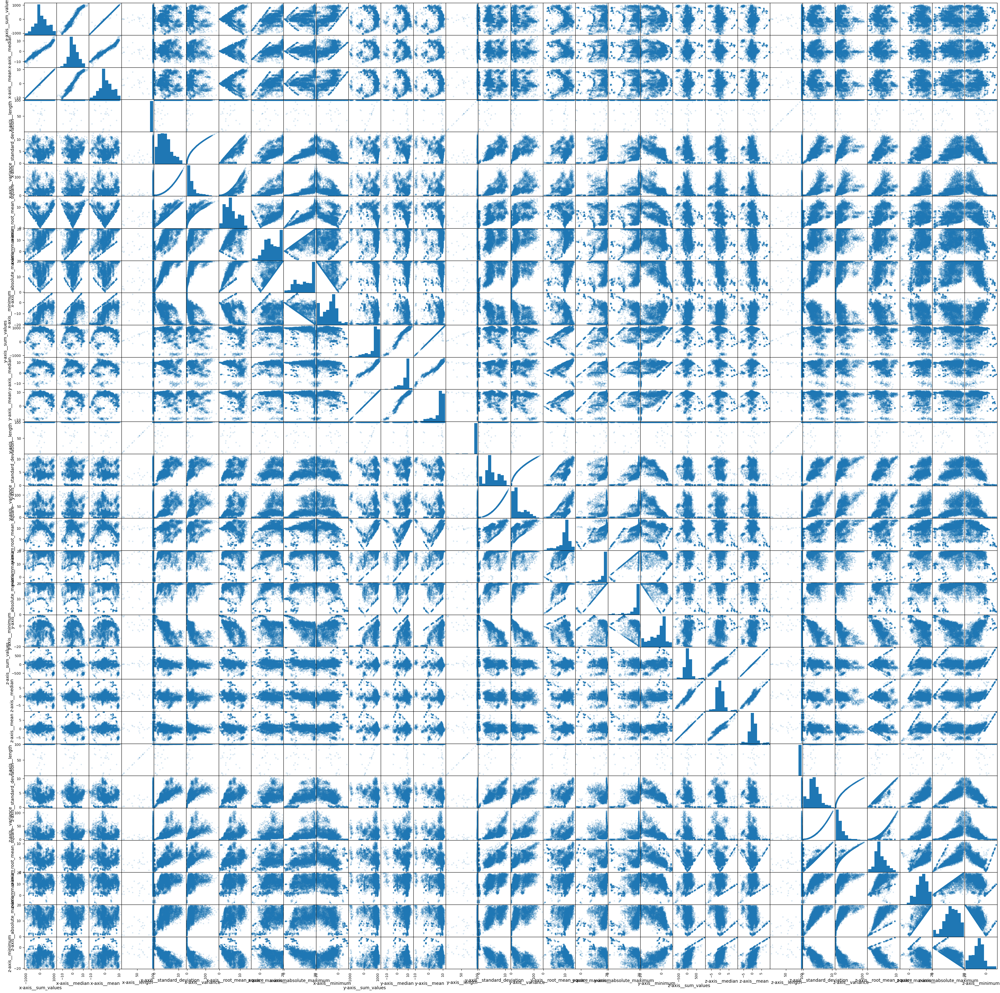

In [ ]:
acceledata_fl=acceledata.select_dtypes(include=['float64'])
pd.plotting.scatter_matrix(acceledata_fl, alpha=0.2, figsize=(40, 40))
plt.show()

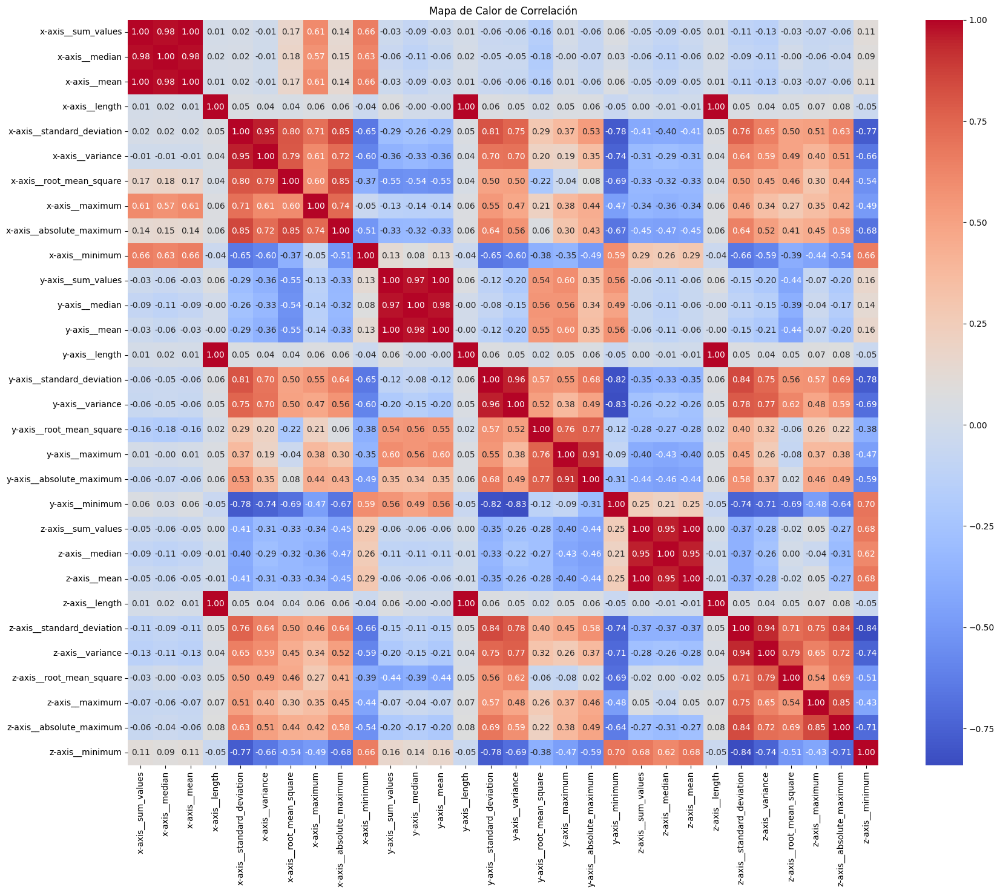

In [ ]:
matriz_correlacion = acceledata_fl.corr()

# Crear el mapa de calor
plt.figure(figsize=(20,16))
sns.heatmap(matriz_correlacion, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Mapa de Calor de Correlación')
plt.show()

In [ ]:
y_train = acceledata[['activity']]
X_train = acceledata.iloc[:, range(1, 31)]

In [ ]:
#Test set
acceledata_test = metadata_test
print(acceledata_test.shape)
acceledata_test.head()

(1934, 32)


,user_snippet,x-axis__sum_values,x-axis__median,x-axis__mean,x-axis__length,x-axis__standard_deviation,x-axis__variance,x-axis__root_mean_square,x-axis__maximum,x-axis__absolute_maximum,x-axis__minimum,y-axis__sum_values,y-axis__median,y-axis__mean,y-axis__length,y-axis__standard_deviation,y-axis__variance,y-axis__root_mean_square,y-axis__maximum,y-axis__absolute_maximum,y-axis__minimum,z-axis__sum_values,z-axis__median,z-axis__mean,z-axis__length,z-axis__standard_deviation,z-axis__variance,z-axis__root_mean_square,z-axis__maximum,z-axis__absolute_maximum,z-axis__minimum,activity
0,3006_0,190.60,1.365,1.9060,100.0,6.192680,38.349290,6.479362,19.50,19.50,-10.46,1042.50,10.895,10.4250,100.0,5.416010,29.333159,11.747927,19.57,19.57,-0.72,-73.61,-0.950,-0.7361,100.0,3.607485,13.013948,3.681819,10.19,10.19,-9.92,Walking
1,3006_1,-115.08,-2.070,-1.1508,100.0,5.779997,33.408361,5.893446,16.82,16.82,-12.49,1052.22,10.590,10.5222,100.0,5.516254,30.429053,11.880478,19.57,19.57,0.61,-13.61,-0.420,-0.1361,100.0,3.551672,12.614374,3.554279,9.47,11.75,-11.75,Walking
2,3006_2,-171.08,-1.710,-1.7108,100.0,5.347172,28.592243,5.614186,13.95,13.95,-11.69,1051.39,10.420,10.5139,100.0,5.421342,29.390952,11.829330,19.57,19.57,0.53,-13.96,-0.480,-0.1396,100.0,2.636698,6.952178,2.640391,8.35,8.50,-8.50,Walking
3,3006_3,633.38,5.790,6.3338,100.0,5.019286,25.193234,8.081476,18.77,18.77,-5.90,915.69,9.130,9.1569,100.0,4.155381,17.267191,10.055646,19.57,19.57,-1.46,26.10,-0.995,0.2610,100.0,4.298020,18.472975,4.305937,11.75,11.75,-8.35,Downstairs
4,3006_4,160.75,1.880,1.6075,100.0,5.769199,33.283657,5.988966,19.50,19.50,-7.78,1035.09,10.440,10.3509,100.0,5.305685,28.150288,11.631484,19.57,19.57,-0.61,-43.41,-0.630,-0.4341,100.0,3.324155,11.050006,3.352380,12.03,12.03,-8.27,Walking


In [ ]:
acceledata_test['activity'].value_counts()

,count
activity,
Walking,768
Jogging,689
Upstairs,238
Downstairs,174
Standing,43
Sitting,22


In [ ]:
y_test = acceledata_test[['activity']]
X_test = acceledata_test.iloc[:, range(1, 31)]

## Aplicación de modelos de machine learning

### Árbol de decisión

In [ ]:
# Columnas de características: todo menos id y target
variable_cols = [col for col in metadata_limpia2.columns
                if col not in ['user_snippet', 'activity']]

# Train
X_train = metadata_limpia2[variable_cols]
y_train = metadata_limpia2['activity']

# Test interno (el que te dieron con activity)
X_test = metadata_test_limpia2[variable_cols]
y_test = metadata_test_limpia2['activity']

X_train.shape, X_test.shape


((6310, 3), (1934, 3))

In [ ]:
from numpy.random.mtrand import random
mdl_tree = DecisionTreeClassifier(criterion='gini',max_depth=3, min_samples_split=20, min_samples_leaf=50, random_state=42).fit(X_train, y_train)

In [ ]:
y_pred = mdl_tree.predict(X_test)
y_pred

array(['Walking', 'Walking', 'Jogging', ..., 'Walking', 'Jogging',
       'Jogging'], dtype=object)

[Text(0.5, 0.875, 'y-axis__mean <= 8.878\ngini = 0.727\nsamples = 6310\nvalue = [606.0, 1951.0, 321.0, 278.0, 702.0, 2452.0]\nclass = 5'),
 Text(0.25, 0.625, 'z-axis__mean <= 3.754\ngini = 0.665\nsamples = 3091\nvalue = [186.0, 1609.0, 300.0, 97.0, 258.0, 641.0]\nclass = 1'),
 Text(0.375, 0.75, 'True  '),
 Text(0.125, 0.375, 'x-axis__mean <= 4.82\ngini = 0.609\nsamples = 2820\nvalue = [183, 1609, 37, 97, 253, 641]\nclass = 1'),
 Text(0.0625, 0.125, 'gini = 0.523\nsamples = 1852\nvalue = [114, 1242, 28, 97, 170, 201]\nclass = 1'),
 Text(0.1875, 0.125, 'gini = 0.637\nsamples = 968\nvalue = [69, 367, 9, 0, 83, 440]\nclass = 5'),
 Text(0.375, 0.375, 'y-axis__mean <= 3.041\ngini = 0.058\nsamples = 271\nvalue = [3, 0, 263, 0, 5, 0]\nclass = 2'),
 Text(0.3125, 0.125, 'gini = 0.0\nsamples = 221\nvalue = [0, 0, 221, 0, 0, 0]\nclass = 2'),
 Text(0.4375, 0.125, 'gini = 0.281\nsamples = 50\nvalue = [3, 0, 42, 0, 5, 0]\nclass = 2'),
 Text(0.75, 0.625, 'x-axis__mean <= -1.462\ngini = 0.633\nsamples 

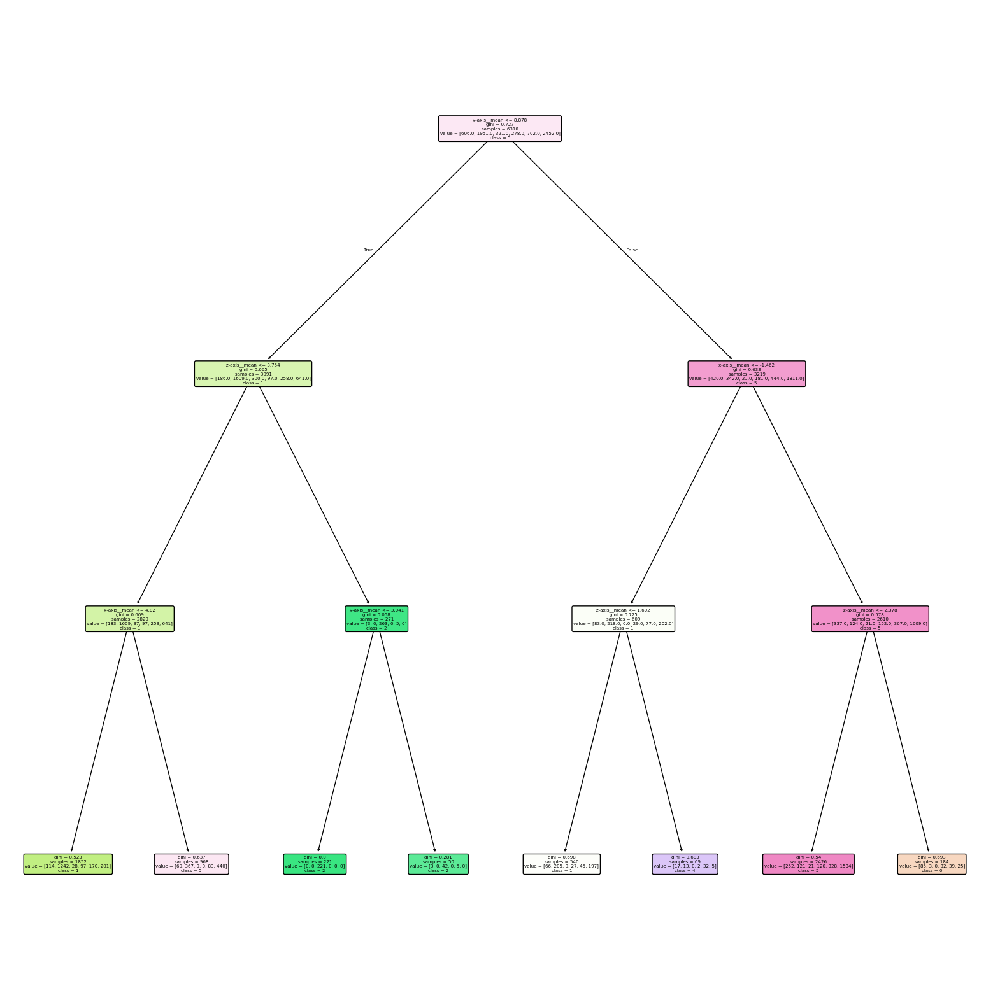

In [ ]:
plt.figure(figsize=(20,20))
tree.plot_tree(mdl_tree, filled=True, rounded=True, class_names=['0','1','2','3','4','5','6','7','8','9'], feature_names=X_train.columns)

In [ ]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",recall_score(y_test, y_pred, average='weighted'))
print("Recall: ", recall_score(y_test, y_pred, average='weighted'))
print("F1: ", f1_score(y_test, y_pred, average='weighted'))

confusion_matrix(y_test, y_pred)

Accuracy: 0.5392967942088935
Precision: 0.5392967942088935
Recall:  0.5392967942088935
F1:  0.4693799165089401


array([[  0,  44,   0,   0,   1, 129],
       [  0, 458,   0,   0,   0, 231],
       [  0,   0,  22,   0,   0,   0],
       [  0,   6,   0,   0,   0,  37],
       [  1,  85,   0,   0,   1, 151],
       [  0, 206,   0,   0,   0, 562]])

In [ ]:
print(f"Gini impurity of the root node: {mdl_tree.tree_.impurity[0]:.3f}")

Gini impurity of the root node: 0.727


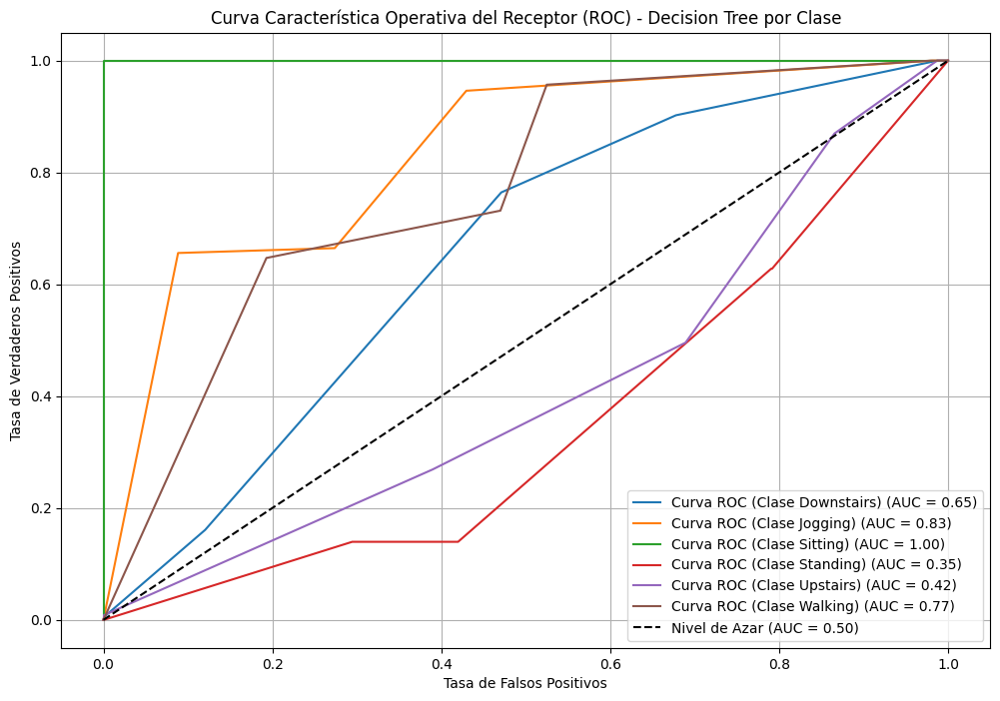

In [ ]:
y_pred_proba_tree = mdl_tree.predict_proba(X_test)
classes_tree = mdl_tree.classes_

y_test_binarized_tree = label_binarize(y_test.values.ravel(), classes=classes_tree)

plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes_tree):
    fpr, tpr, _ = roc_curve(y_test_binarized_tree[:, i], y_pred_proba_tree[:, i])
    roc_auc_per_class = auc_function(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Curva ROC (Clase {class_name}) (AUC = {roc_auc_per_class:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Nivel de Azar (AUC = 0.50)')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva Característica Operativa del Receptor (ROC) - Decision Tree por Clase')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [ ]:
# 1. Tomar los IDs de user_snippet desde metadata_kaggle
ids = metadata_kaggle['user_snippet'].reset_index(drop=True)

# 2. Variables explicativas SIN user_snippet
X_predi = metadata_kaggle_limpia2.drop(columns=['user_snippet'])

# 3. Tomar predicción
pred_kaggle = mdl_tree.predict(X_predi)

# 4. Convertir las predicciones a DataFrame
arbolD = pd.DataFrame({
    'user_snippet': ids,
    'pred_activity': pred_kaggle
})

# Guardar en CSV con el formato requerido para subir a Kaggle para la competencia
arbolD.to_csv('predictions_IvHubMetrics.csv', index=False)

# Modelo subido el 27/11/205

**Árbol de decisión con todas las columnas**

In [ ]:
# Columnas de características: todo menos id y target
variable_cols = [col for col in metadata.columns
                if col not in ['user_snippet', 'activity']]

# Train
X_train = metadata[variable_cols]
y_train = metadata['activity']

# Test interno (el que te dieron con activity)
X_test = metadata_test[variable_cols]
y_test = metadata_test['activity']

X_train.shape, X_test.shape


((6310, 30), (1934, 30))

In [ ]:
from numpy.random.mtrand import random
mdl_tree = DecisionTreeClassifier(criterion='gini',max_depth=3, min_samples_split=20, min_samples_leaf=50, random_state=42).fit(X_train, y_train)

In [ ]:
y_pred = mdl_tree.predict(X_test)
y_pred

array(['Walking', 'Walking', 'Upstairs', ..., 'Walking', 'Jogging',
       'Jogging'], dtype=object)

[Text(0.5, 0.875, 'y-axis__variance <= 37.543\ngini = 0.727\nsamples = 6310\nvalue = [606.0, 1951.0, 321.0, 278.0, 702.0, 2452.0]\nclass = 5'),
 Text(0.25, 0.625, 'y-axis__standard_deviation <= 1.674\ngini = 0.665\nsamples = 4367\nvalue = [584, 206, 321, 278, 657, 2321]\nclass = 5'),
 Text(0.375, 0.75, 'True  '),
 Text(0.125, 0.375, 'z-axis__root_mean_square <= 3.696\ngini = 0.51\nsamples = 588\nvalue = [0, 0, 307, 274, 7, 0]\nclass = 2'),
 Text(0.0625, 0.125, 'gini = 0.196\nsamples = 305\nvalue = [0.0, 0.0, 27.0, 272.0, 6.0, 0.0]\nclass = 3'),
 Text(0.1875, 0.125, 'gini = 0.021\nsamples = 283\nvalue = [0, 0, 280, 2, 1, 0]\nclass = 2'),
 Text(0.375, 0.375, 'z-axis__standard_deviation <= 2.818\ngini = 0.566\nsamples = 3779\nvalue = [584, 206, 14, 4, 650, 2321]\nclass = 5'),
 Text(0.3125, 0.125, 'gini = 0.669\nsamples = 1108\nvalue = [345.0, 4.0, 8.0, 2.0, 431.0, 318.0]\nclass = 4'),
 Text(0.4375, 0.125, 'gini = 0.417\nsamples = 2671\nvalue = [239.0, 202.0, 6.0, 2.0, 219.0, 2003.0]\nclas

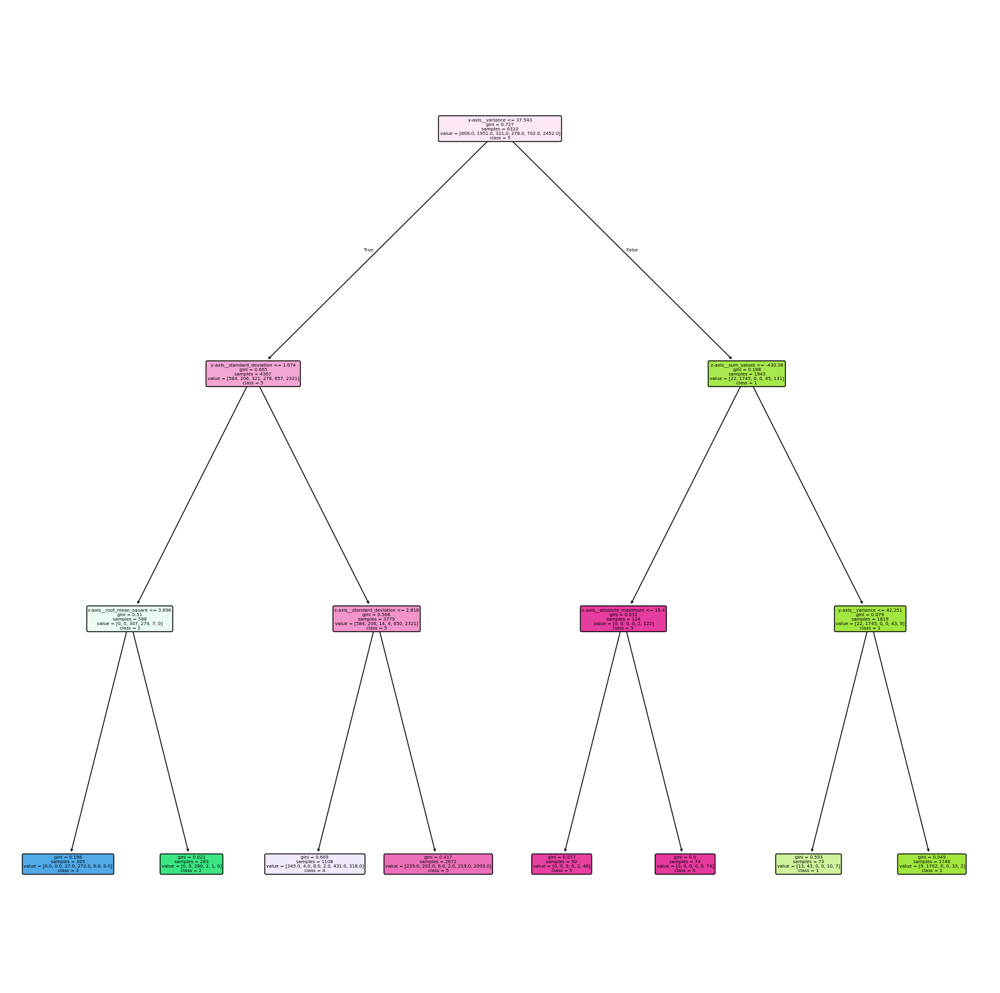

In [ ]:
plt.figure(figsize=(20,20))
tree.plot_tree(mdl_tree, filled=True, rounded=True, class_names=['0','1','2','3','4','5','6','7','8','9'], feature_names=X_train.columns)

In [ ]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",recall_score(y_test, y_pred, average='weighted'))
print("Recall: ", recall_score(y_test, y_pred, average='weighted'))
print("F1: ", f1_score(y_test, y_pred, average='weighted'))

confusion_matrix(y_test, y_pred)

Accuracy: 0.8107549120992761
Precision: 0.8107549120992761
Recall:  0.8107549120992761
F1:  0.7717488017255704


array([[  0,   1,   0,   0,  63, 110],
       [  0, 661,   0,   0,   0,  28],
       [  0,   0,  20,   0,   0,   2],
       [  0,   0,   0,  43,   0,   0],
       [  0,  16,   0,   0, 116, 106],
       [  0,   2,   0,   0,  38, 728]])

In [ ]:
print(f"Gini impurity of the root node: {mdl_tree.tree_.impurity[0]:.3f}")

Gini impurity of the root node: 0.727


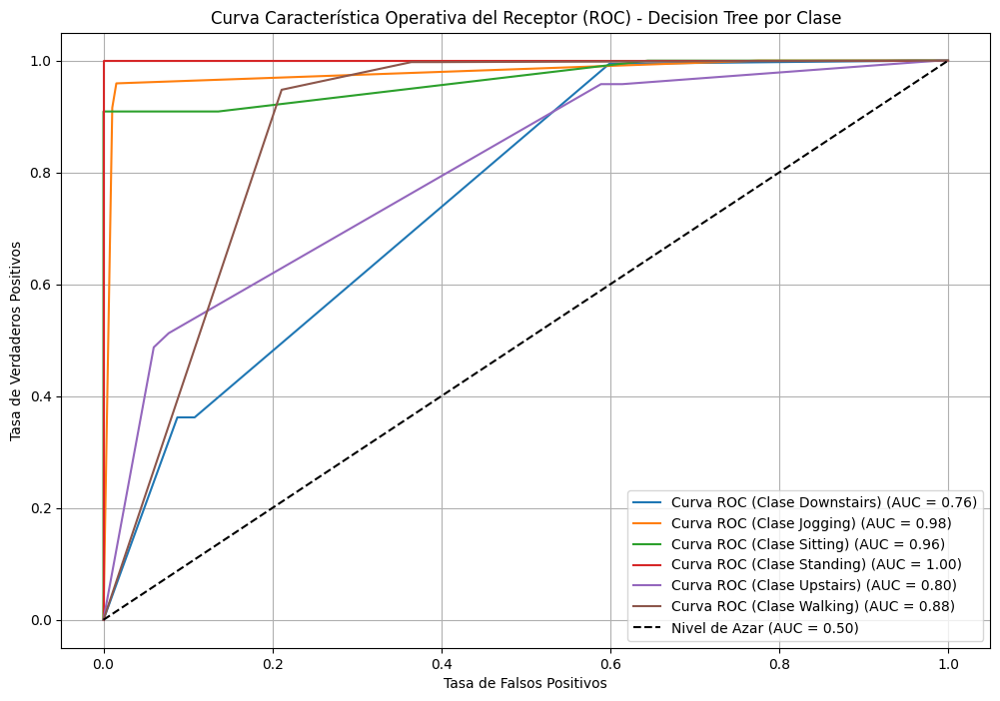

In [ ]:
y_pred_proba_tree = mdl_tree.predict_proba(X_test)
classes_tree = mdl_tree.classes_

y_test_binarized_tree = label_binarize(y_test.values.ravel(), classes=classes_tree)

plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes_tree):
    fpr, tpr, _ = roc_curve(y_test_binarized_tree[:, i], y_pred_proba_tree[:, i])
    roc_auc_per_class = auc_function(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Curva ROC (Clase {class_name}) (AUC = {roc_auc_per_class:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Nivel de Azar (AUC = 0.50)')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva Característica Operativa del Receptor (ROC) - Decision Tree por Clase')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [ ]:
# 1. Tomar los IDs de user_snippet desde metadata_kaggle
ids = metadata_kaggle['user_snippet'].reset_index(drop=True)

# 2. Variables explicativas SIN user_snippet
X_predi = metadata_kaggle.drop(columns=['user_snippet'])

# 3. Tomar predicción
pred_kaggle = mdl_tree.predict(X_predi)

# 4. Convertir las predicciones a DataFrame
arbolD = pd.DataFrame({
    'user_snippet': ids,
    'pred_activity': pred_kaggle
})

# Guardar en CSV con el formato requerido para subir a Kaggle para la competencia
arbolD.to_csv('predictions_IvHubMetrics.csv', index=False)

# Modelo subido el 27/11/205

**Árbol de decisión columnas amplias**

In [ ]:
# Columnas de características: todo menos id y target
variable_cols = [col for col in metadata_limpia.columns
                if col not in ['user_snippet', 'activity']]

# Train
X_train = metadata_limpia[variable_cols]
y_train = metadata_limpia['activity']

# Test interno (el que te dieron con activity)
X_test = metadata_test_limpia[variable_cols]
y_test = metadata_test_limpia['activity']

X_train.shape, X_test.shape


((6310, 21), (1934, 21))

In [ ]:
from numpy.random.mtrand import random
mdl_tree = DecisionTreeClassifier(criterion='gini',max_depth=3, min_samples_split=20, min_samples_leaf=50, random_state=42).fit(X_train, y_train)

In [ ]:
y_pred = mdl_tree.predict(X_test)
y_pred

array(['Walking', 'Walking', 'Upstairs', ..., 'Walking', 'Jogging',
       'Jogging'], dtype=object)

[Text(0.5, 0.875, 'y-axis__standard_deviation <= 6.127\ngini = 0.727\nsamples = 6310\nvalue = [606.0, 1951.0, 321.0, 278.0, 702.0, 2452.0]\nclass = 5'),
 Text(0.25, 0.625, 'y-axis__standard_deviation <= 1.674\ngini = 0.665\nsamples = 4367\nvalue = [584, 206, 321, 278, 657, 2321]\nclass = 5'),
 Text(0.375, 0.75, 'True  '),
 Text(0.125, 0.375, 'z-axis__root_mean_square <= 3.696\ngini = 0.51\nsamples = 588\nvalue = [0, 0, 307, 274, 7, 0]\nclass = 2'),
 Text(0.0625, 0.125, 'gini = 0.196\nsamples = 305\nvalue = [0.0, 0.0, 27.0, 272.0, 6.0, 0.0]\nclass = 3'),
 Text(0.1875, 0.125, 'gini = 0.021\nsamples = 283\nvalue = [0, 0, 280, 2, 1, 0]\nclass = 2'),
 Text(0.375, 0.375, 'z-axis__standard_deviation <= 2.818\ngini = 0.566\nsamples = 3779\nvalue = [584, 206, 14, 4, 650, 2321]\nclass = 5'),
 Text(0.3125, 0.125, 'gini = 0.669\nsamples = 1108\nvalue = [345.0, 4.0, 8.0, 2.0, 431.0, 318.0]\nclass = 4'),
 Text(0.4375, 0.125, 'gini = 0.417\nsamples = 2671\nvalue = [239.0, 202.0, 6.0, 2.0, 219.0, 2003

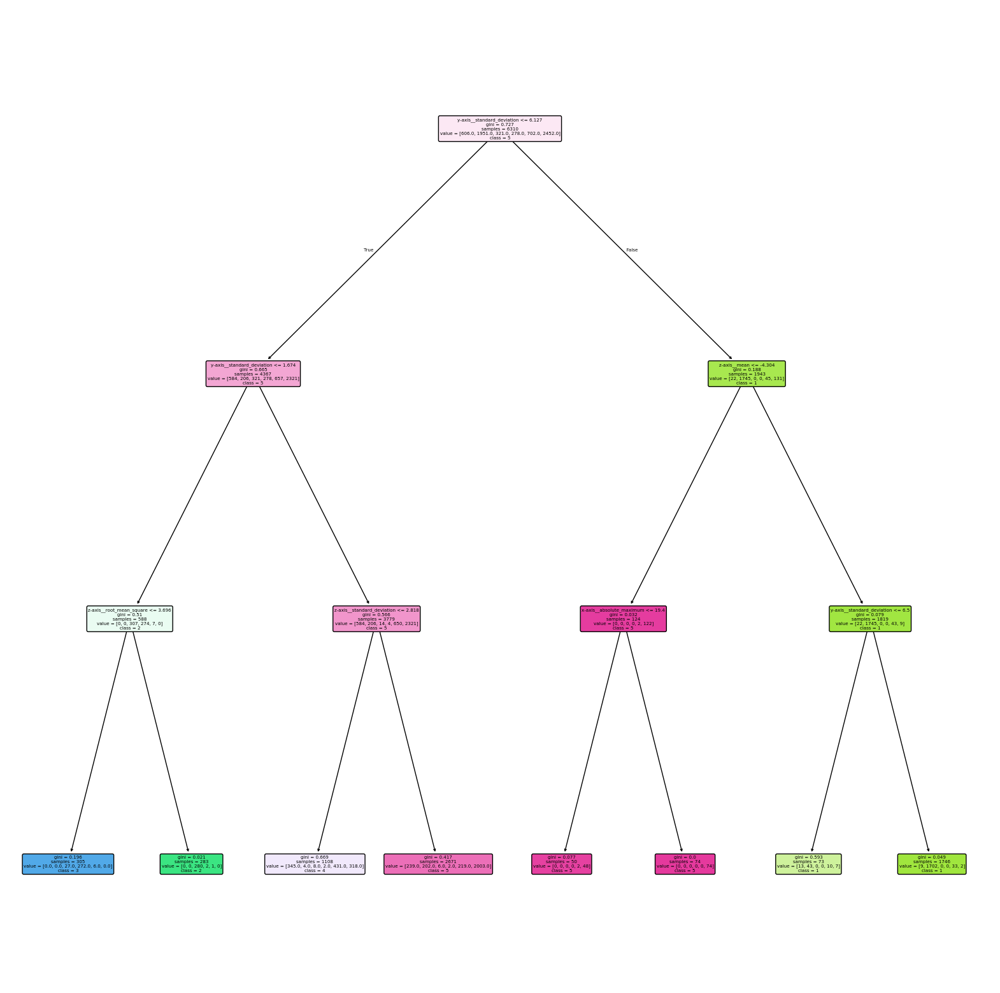

In [ ]:
plt.figure(figsize=(20,20))
tree.plot_tree(mdl_tree, filled=True, rounded=True, class_names=['0','1','2','3','4','5','6','7','8','9'], feature_names=X_train.columns)

In [ ]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",recall_score(y_test, y_pred, average='weighted'))
print("Recall: ", recall_score(y_test, y_pred, average='weighted'))
print("F1: ", f1_score(y_test, y_pred, average='weighted'))

confusion_matrix(y_test, y_pred)

Accuracy: 0.8107549120992761
Precision: 0.8107549120992761
Recall:  0.8107549120992761
F1:  0.7717488017255704


array([[  0,   1,   0,   0,  63, 110],
       [  0, 661,   0,   0,   0,  28],
       [  0,   0,  20,   0,   0,   2],
       [  0,   0,   0,  43,   0,   0],
       [  0,  16,   0,   0, 116, 106],
       [  0,   2,   0,   0,  38, 728]])

In [ ]:
print(f"Gini impurity of the root node: {mdl_tree.tree_.impurity[0]:.3f}")

Gini impurity of the root node: 0.727


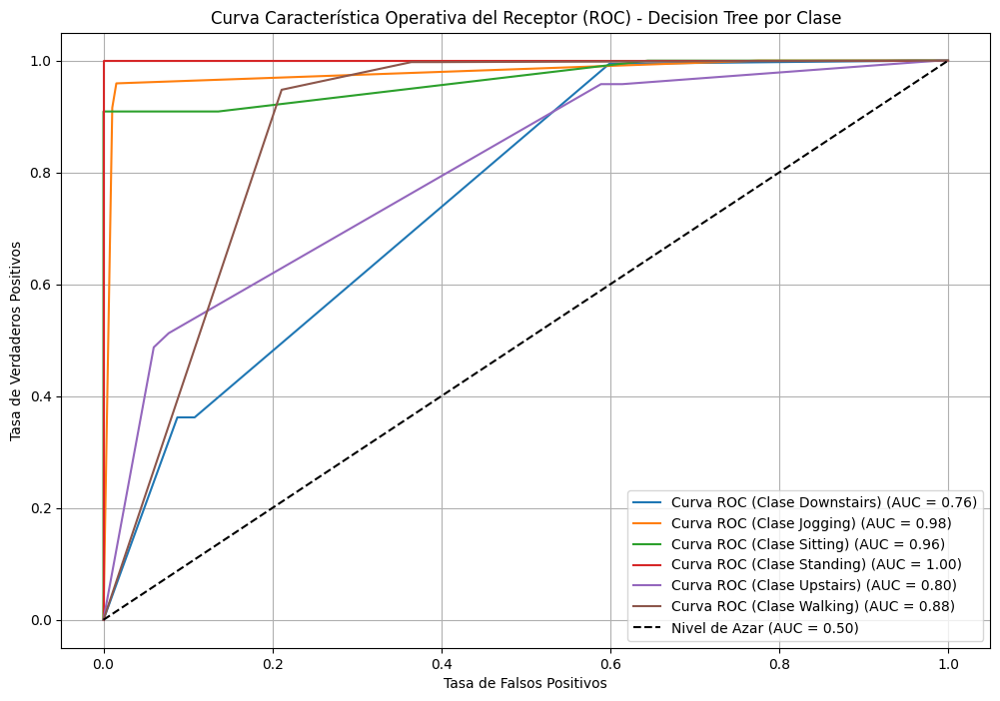

In [ ]:
y_pred_proba_tree = mdl_tree.predict_proba(X_test)
classes_tree = mdl_tree.classes_

y_test_binarized_tree = label_binarize(y_test.values.ravel(), classes=classes_tree)

plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes_tree):
    fpr, tpr, _ = roc_curve(y_test_binarized_tree[:, i], y_pred_proba_tree[:, i])
    roc_auc_per_class = auc_function(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Curva ROC (Clase {class_name}) (AUC = {roc_auc_per_class:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Nivel de Azar (AUC = 0.50)')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva Característica Operativa del Receptor (ROC) - Decision Tree por Clase')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [ ]:
# 1. Tomar los IDs de user_snippet desde metadata_kaggle
ids = metadata_kaggle['user_snippet'].reset_index(drop=True)

# 2. Variables explicativas SIN user_snippet
X_predi = metadata_kaggle_limpia.drop(columns=['user_snippet'])

# 3. Tomar predicción
pred_kaggle = mdl_tree.predict(X_predi)

# 4. Convertir las predicciones a DataFrame
arbolD = pd.DataFrame({
    'user_snippet': ids,
    'pred_activity': pred_kaggle
})

# Guardar en CSV con el formato requerido para subir a Kaggle para la competencia
arbolD.to_csv('predictions_IvHubMetrics.csv', index=False)

# Modelo subido el 25/11/205

### Random forest

In [ ]:
# Definir X_train y y_train específicamente para el Random Forest
y_train = acceledata[['activity']]
X_train = acceledata.iloc[:, range(1, 31)]

# Definir X_test y y_test específicamente para el Random Forest
y_test = acceledata_test[['activity']]
X_test = acceledata_test.iloc[:, range(1, 31)]

accelerandom = RandomForestClassifier(n_estimators=1000, random_state=42, class_weight='balanced')
accelerandom.fit(X_train, y_train)


NameError: name 'acceledata' is not defined

In [ ]:
y_pred6 = accelerandom.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred6))
confusion_matrix(y_test, y_pred6)

Accuracy: 0.8159255429162358


array([[ 34,   2,   0,   0,  29, 109],
       [  0, 678,   0,   0,   0,  11],
       [  0,   0,  22,   0,   0,   0],
       [  0,   0,  16,  26,   1,   0],
       [ 38,  33,   0,   0, 101,  66],
       [  5,   3,   0,   0,  43, 717]])

In [ ]:
# Acceder al primer árbol del bosque
first_tree = accelerandom.estimators_[0]

# Obtener la impureza del nodo raíz
gini_root = first_tree.tree_.impurity[0]
print(f"Gini impurity del nodo raíz: {gini_root:.3f}")

Gini impurity del nodo raíz: 0.833


In [ ]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred6))
print("Precision:",recall_score(y_test, y_pred6, average='weighted'))
print("Recall: ", recall_score(y_test, y_pred6, average='weighted'))
print("F1: ", f1_score(y_test, y_pred6, average='weighted'))

Accuracy: 0.8159255429162358
Precision: 0.8159255429162358
Recall:  0.8159255429162358
F1:  0.7944220890264427


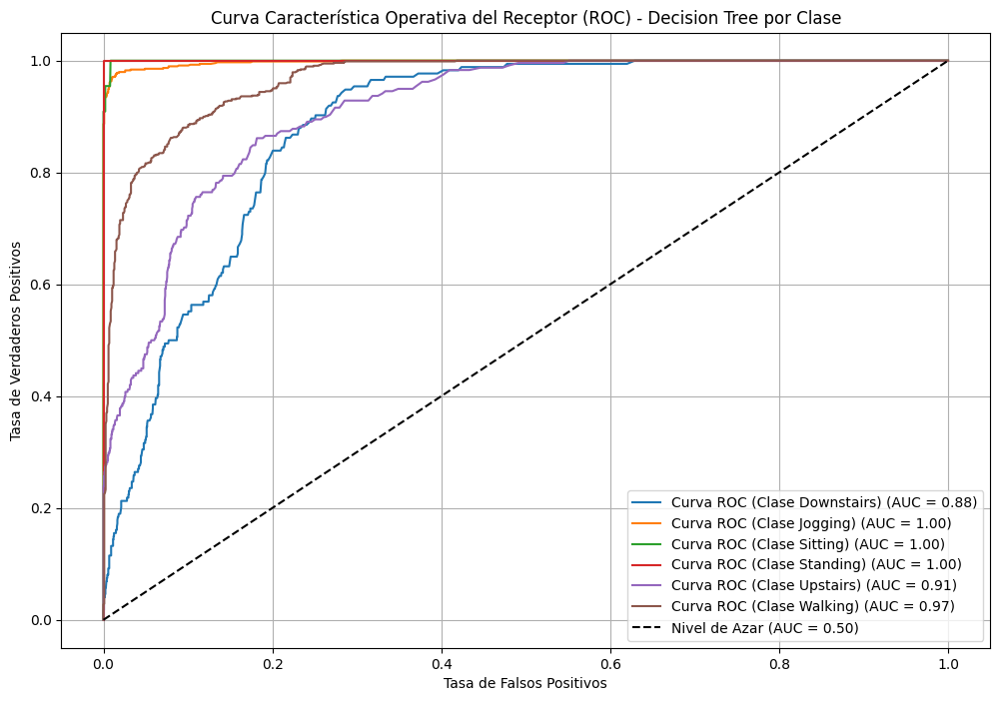

In [ ]:
y_pred_proba_tree2 = accelerandom.predict_proba(X_test)
classes_tree = accelerandom.classes_

y_test_binarized_tree = label_binarize(y_test.values.ravel(), classes=classes_tree)

plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes_tree):
    fpr, tpr, _ = roc_curve(y_test_binarized_tree[:, i], y_pred_proba_tree2[:, i])
    roc_auc_per_class = auc_function(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Curva ROC (Clase {class_name}) (AUC = {roc_auc_per_class:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Nivel de Azar (AUC = 0.50)')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva Característica Operativa del Receptor (ROC) - Decision Tree por Clase')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [ ]:
accelekagle=metadata_kaggle
print(accelekagle.shape)
user_accelekagle = accelekagle['user_snippet']
accelekagle = accelekagle.drop(columns=['user_snippet'])
accelekagle.head()

(2506, 31)


,x-axis__sum_values,x-axis__median,x-axis__mean,x-axis__length,x-axis__standard_deviation,x-axis__variance,x-axis__root_mean_square,x-axis__maximum,x-axis__absolute_maximum,x-axis__minimum,y-axis__sum_values,y-axis__median,y-axis__mean,y-axis__length,y-axis__standard_deviation,y-axis__variance,y-axis__root_mean_square,y-axis__maximum,y-axis__absolute_maximum,y-axis__minimum,z-axis__sum_values,z-axis__median,z-axis__mean,z-axis__length,z-axis__standard_deviation,z-axis__variance,z-axis__root_mean_square,z-axis__maximum,z-axis__absolute_maximum,z-axis__minimum
0,880.46,8.560,8.8046,100.0,5.146708,26.488599,10.198509,19.53,19.53,-1.04,517.84,4.615,5.1784,100.0,3.806477,14.489265,6.426904,17.24,17.24,-2.49,-6.605867,-0.762740,-0.066059,100.0,3.058799,9.356253,3.059513,9.615966,9.615966,-9.152874
1,552.88,5.520,5.5288,100.0,0.039173,0.001535,5.528939,5.63,5.63,5.43,251.05,2.530,2.5105,100.0,0.028333,0.000803,2.510660,2.56,2.56,2.45,823.670000,8.240000,8.236700,100.0,0.037445,0.001402,8.236785,8.310000,8.310000,8.120000
2,848.84,8.045,8.4884,100.0,4.789062,22.935113,9.746181,19.57,19.57,-1.50,528.33,4.805,5.2833,100.0,3.656953,13.373308,6.425462,14.29,14.29,-2.79,-7.995144,-0.211115,-0.079951,100.0,3.178891,10.105348,3.179896,9.656827,9.656827,-7.014479
3,100.93,0.990,1.0093,100.0,0.044525,0.001983,1.010282,1.12,1.12,0.89,992.36,9.920,9.9236,100.0,0.020373,0.000415,9.923621,10.00,10.00,9.89,29.770000,0.310000,0.297700,100.0,0.032058,0.001028,0.299421,0.340000,0.340000,0.190000
4,845.52,7.970,8.4552,100.0,4.858636,23.606345,9.751756,19.57,19.57,-2.45,523.32,4.770,5.2332,100.0,3.628599,13.166734,6.368133,15.51,15.51,-2.83,1.757024,-0.483522,0.017570,100.0,3.475728,12.080686,3.475773,10.310603,10.310603,-9.956474


In [ ]:
predict_randomf = accelerandom.predict(accelekagle)

In [ ]:
resultados = pd.DataFrame({
    'user_snippet': user_accelekagle,
    'prediction': predict_randomf
})
resultados

,user_snippet,prediction
0,8054_0,Walking
1,8054_1,Sitting
2,8054_2,Walking
3,8054_3,Standing
4,8054_4,Walking
...,...,...
2501,8488_355,Jogging
2502,8488_356,Walking
2503,8488_357,Jogging
2504,8488_358,Walking


In [ ]:
#Primeros resultados del random forest enviados en el concuros de kaggle el 7 de noviembre de 2025
resultados.to_csv('/content/drive/MyDrive/Coursework/predictions_IvHubMetrics.csv', index=False)

**Random Rorest con datos limpios**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import pandas as pd
import numpy as np

# Separar variables (1 a 20) y target (activity)
X_train = metadata_limpia.iloc[:, 1:21]
y_train = metadata_limpia['activity']

X_test = metadata_test_limpia.iloc[:, 1:21]
y_test = metadata_test_limpia['activity']

X_kaggle = metadata_kaggle_limpia.iloc[:, 1:21]
ids_kaggle = metadata_kaggle_limpia['user_snippet']


In [ ]:
rf = RandomForestClassifier(
    n_estimators=500,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=8,
    bootstrap=True,
    random_state=42,
    n_jobs=-1
)


In [ ]:
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nMatriz de Confusión:")
print(confusion_matrix(y_test, y_pred))

print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred))


Accuracy: 0.8159255429162358

Matriz de Confusión:
[[ 34   4   0   0  29 107]
 [  0 678   0   0   0  11]
 [  0   0  22   0   0   0]
 [  0   0  22  20   1   0]
 [ 19  33   0   0  99  87]
 [  2   6   0   0  35 725]]

Reporte de Clasificación:
              precision    recall  f1-score   support

  Downstairs       0.62      0.20      0.30       174
     Jogging       0.94      0.98      0.96       689
     Sitting       0.50      1.00      0.67        22
    Standing       1.00      0.47      0.63        43
    Upstairs       0.60      0.42      0.49       238
     Walking       0.78      0.94      0.85       768

    accuracy                           0.82      1934
   macro avg       0.74      0.67      0.65      1934
weighted avg       0.80      0.82      0.79      1934



In [ ]:
importances = pd.DataFrame({
    'variable': X_train.columns,
    'importancia': rf.feature_importances_
}).sort_values('importancia', ascending=False)

importances


,variable,importancia
9,y-axis__standard_deviation,0.158124
13,y-axis__minimum,0.114294
16,z-axis__standard_deviation,0.113312
2,x-axis__standard_deviation,0.087047
17,z-axis__root_mean_square,0.055734
12,y-axis__absolute_maximum,0.052357
14,z-axis__median,0.047861
15,z-axis__mean,0.047310
11,y-axis__maximum,0.038966
8,y-axis__mean,0.034259


In [ ]:
pred_kaggle = rf.predict(X_kaggle)

pred_df = pd.DataFrame({
    'user_snippet': ids_kaggle,
    'activity': pred_kaggle
})

pred_df.to_csv("predictions_IvHubMetrics.csv", index=False)
print("Archivo guardado: predictions_IvHubMetrics.csv")


Archivo guardado: predictions_IvHubMetrics.csv


## Regresión Logística

Se identificó alta correlación para:
* La cuenta de cantidad de snippets o fragmentos. Como se tiene 100 snippets por usuario hay correlación. Dado que es una variable innecesaria, no se tiene en cuenta en la regresión.
* Es conveniente escoger entre varianza y desviación estándar las dos arrojan información similar y están correlacionadas.
* La suma total del valor de los snippets presenta alta correlación con variables como la media y la mediana. La suma total no es un dato necesario y para corregir la multicolinealidad, se presinde de esta columna.

Teniendo en cuenta las medidas anteriores, se corrige la multicolinealidad y la alta correlación entre variables. Si las columnas eliminadas fueran relevantes desde el punto de vista del negocio o del análisis práctico de las actividades humanas, podrían conservarse y controlarse mediante técnicas de regularización como Ridge o Lasso. Sin embargo, dado que no aportan valor en este contexto y tienden a introducir ruido, se decide prescindir de ellas.

Se anota que el modelo se probó tanto con regularización de Ridge, de Lasso y sin ninguna regularización.

***Modelo sin penalización pero con mezcla (shuffle) - Método de validación split***

In [ ]:
base = 'https://raw.githubusercontent.com/ivonnelinares10-prog/2025_II_MLAceleradores/main/'

metadataRLogistica = pd.read_csv(base + 'metadata.csv')
metadata_kaggleRLogistica = pd.read_csv(base + 'metadata_kaggle.csv')
metadata_testRLogistica = pd.read_csv(base + 'metadata_test.csv')


metadata_unionRLogistica = pd.concat([metadataRLogistica, metadata_testRLogistica])

In [ ]:
metadata_unionRLogistica.columns

Index(['user_snippet', 'x-axis__sum_values', 'x-axis__median', 'x-axis__mean',
       'x-axis__length', 'x-axis__standard_deviation', 'x-axis__variance',
       'x-axis__root_mean_square', 'x-axis__maximum',
       'x-axis__absolute_maximum', 'x-axis__minimum', 'y-axis__sum_values',
       'y-axis__median', 'y-axis__mean', 'y-axis__length',
       'y-axis__standard_deviation', 'y-axis__variance',
       'y-axis__root_mean_square', 'y-axis__maximum',
       'y-axis__absolute_maximum', 'y-axis__minimum', 'z-axis__sum_values',
       'z-axis__median', 'z-axis__mean', 'z-axis__length',
       'z-axis__standard_deviation', 'z-axis__variance',
       'z-axis__root_mean_square', 'z-axis__maximum',
       'z-axis__absolute_maximum', 'z-axis__minimum', 'activity'],
      dtype='object')

In [ ]:
metadata_unionRLogistica.shape

(8244, 32)

In [ ]:
c_drop = [
    'x-axis__sum_values', 'y-axis__sum_values', 'z-axis__sum_values',
    'x-axis__variance', 'y-axis__variance', 'z-axis__variance',
    'x-axis__length', 'y-axis__length', 'z-axis__length'
]

metadata_unionRLogistica_limpia = metadata_unionRLogistica.drop(columns=c_drop)
metadata_unionRLogistica_limpia.columns

Index(['user_snippet', 'x-axis__median', 'x-axis__mean',
       'x-axis__standard_deviation', 'x-axis__root_mean_square',
       'x-axis__maximum', 'x-axis__absolute_maximum', 'x-axis__minimum',
       'y-axis__median', 'y-axis__mean', 'y-axis__standard_deviation',
       'y-axis__root_mean_square', 'y-axis__maximum',
       'y-axis__absolute_maximum', 'y-axis__minimum', 'z-axis__median',
       'z-axis__mean', 'z-axis__standard_deviation',
       'z-axis__root_mean_square', 'z-axis__maximum',
       'z-axis__absolute_maximum', 'z-axis__minimum', 'activity'],
      dtype='object')

In [ ]:
metadata_unionRLogistica_limpia.shape

(8244, 23)

In [ ]:
metadata_kaggleRLogistica.columns

Index(['user_snippet', 'x-axis__sum_values', 'x-axis__median', 'x-axis__mean',
       'x-axis__length', 'x-axis__standard_deviation', 'x-axis__variance',
       'x-axis__root_mean_square', 'x-axis__maximum',
       'x-axis__absolute_maximum', 'x-axis__minimum', 'y-axis__sum_values',
       'y-axis__median', 'y-axis__mean', 'y-axis__length',
       'y-axis__standard_deviation', 'y-axis__variance',
       'y-axis__root_mean_square', 'y-axis__maximum',
       'y-axis__absolute_maximum', 'y-axis__minimum', 'z-axis__sum_values',
       'z-axis__median', 'z-axis__mean', 'z-axis__length',
       'z-axis__standard_deviation', 'z-axis__variance',
       'z-axis__root_mean_square', 'z-axis__maximum',
       'z-axis__absolute_maximum', 'z-axis__minimum'],
      dtype='object')

In [ ]:
metadata_kaggleRLogistica.shape

(2506, 31)

In [ ]:
c_drop = [
    'x-axis__sum_values', 'y-axis__sum_values', 'z-axis__sum_values',
    'x-axis__variance', 'y-axis__variance', 'z-axis__variance',
    'x-axis__length', 'y-axis__length', 'z-axis__length'
]

metadata_kaggleRLogistica_limpia = metadata_kaggleRLogistica.drop(columns=c_drop)
metadata_kaggleRLogistica_limpia.columns

Index(['user_snippet', 'x-axis__median', 'x-axis__mean',
       'x-axis__standard_deviation', 'x-axis__root_mean_square',
       'x-axis__maximum', 'x-axis__absolute_maximum', 'x-axis__minimum',
       'y-axis__median', 'y-axis__mean', 'y-axis__standard_deviation',
       'y-axis__root_mean_square', 'y-axis__maximum',
       'y-axis__absolute_maximum', 'y-axis__minimum', 'z-axis__median',
       'z-axis__mean', 'z-axis__standard_deviation',
       'z-axis__root_mean_square', 'z-axis__maximum',
       'z-axis__absolute_maximum', 'z-axis__minimum'],
      dtype='object')

In [ ]:
metadata_kaggleRLogistica_limpia.shape

(2506, 22)

In [ ]:
# Se mezcla todo
metadata_unionRLogistica_limpia = metadata_unionRLogistica_limpia.sample(frac=1, random_state=42) # n = 1 para que sea mezclado el 100%. El 42 es la semilla aleatoria.
metadata_unionRLogistica_limpia.shape

(8244, 23)

In [ ]:
# Separación
y = metadata_unionRLogistica_limpia['activity']
X = metadata_unionRLogistica_limpia.drop(columns=['activity', 'user_snippet'])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.25, #25% para test
    random_state=42,
    stratify=y   # Har multiclase
)

In [ ]:
X_train, X_test, y_train, y_test

(      x-axis__median  x-axis__mean  x-axis__standard_deviation  \
 2755          -8.010       -8.0346                    0.248722   
 4463          -1.495       -1.4911                    6.217867   
 4912          -0.995       -1.0036                    3.952885   
 1462          -2.470       -5.4774                    7.388168   
 2823           7.600        7.6066                    6.714697   
 ...              ...           ...                         ...   
 1428          -0.380       -0.3604                    2.485077   
 5256           3.010        4.9830                    9.899779   
 4142           1.270        1.5043                    1.525913   
 1508           0.885        0.5863                    1.709518   
 5956          -0.665       -1.1316                    9.175907   
 
       x-axis__root_mean_square  x-axis__maximum  x-axis__absolute_maximum  \
 2755                  8.038449            -7.44                      8.77   
 4463                  6.394158       

In [ ]:
rlogit_sin_penal = LogisticRegression(
    penalty=None,      # sin L1 ni L2
    solver='lbfgs',
    max_iter=1000,
    multi_class='ovr'
)

# Entrenar
rlogit_sin_penal.fit(X_train, y_train)

# Predecir
y_pred_sin = rlogit_sin_penal.predict(X_test)

# Evaluar
print("Modelo SIN penalización")
print("Matriz de confusión:")
print(confusion_matrix(y_test, y_pred_sin))
print("\nReporte de clasificación:")
print(classification_report(y_test, y_pred_sin))

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Modelo SIN penalización
Matriz de confusión:
[[ 68   6   0   0  23  98]
 [  0 645   0   0   4  11]
 [  0   0  78   6   2   0]
 [  0   0   6  72   1   1]
 [ 18  22   3   1  77 114]
 [ 18  15   0   1   8 763]]

Reporte de clasificación:
              precision    recall  f1-score   support

  Downstairs       0.65      0.35      0.45       195
     Jogging       0.94      0.98      0.96       660
     Sitting       0.90      0.91      0.90        86
    Standing       0.90      0.90      0.90        80
    Upstairs       0.67      0.33      0.44       235
     Walking       0.77      0.95      0.85       805

    accuracy                           0.83      2061
   macro avg       0.81      0.73      0.75      2061
weighted avg       0.81      0.83      0.80      2061



In [ ]:
print("Accuracy: ", accuracy_score(y_test, y_pred_sin))
print("Precision: ", precision_score(y_test, y_pred_sin, average='weighted'))
print("Recall: ", recall_score(y_test, y_pred_sin, average='weighted'))
print("F1: ", f1_score(y_test, y_pred_sin, average='weighted'))
y_pred_prob_sin = rlogit_sin_penal.predict_proba(X_test)
print("AUC: ", roc_auc_score(y_test.values.ravel(), y_pred_prob_sin, multi_class='ovr', average='weighted'))

Accuracy:  0.8262979136341582
Precision:  0.8127153027180135
Recall:  0.8262979136341582
F1:  0.804830165700694
AUC:  0.9605513270664047


In [ ]:
y_test_flat = y_test.values.ravel()
cross_entropy_sin = log_loss(y_test_flat, y_pred_prob_sin)
print(f"Función de pérdida Cross-Entropy para Regresión Logística sin regularización: {cross_entropy_sin:.4f}")

Función de pérdida Cross-Entropy para Regresión Logística sin regularización: 0.4930


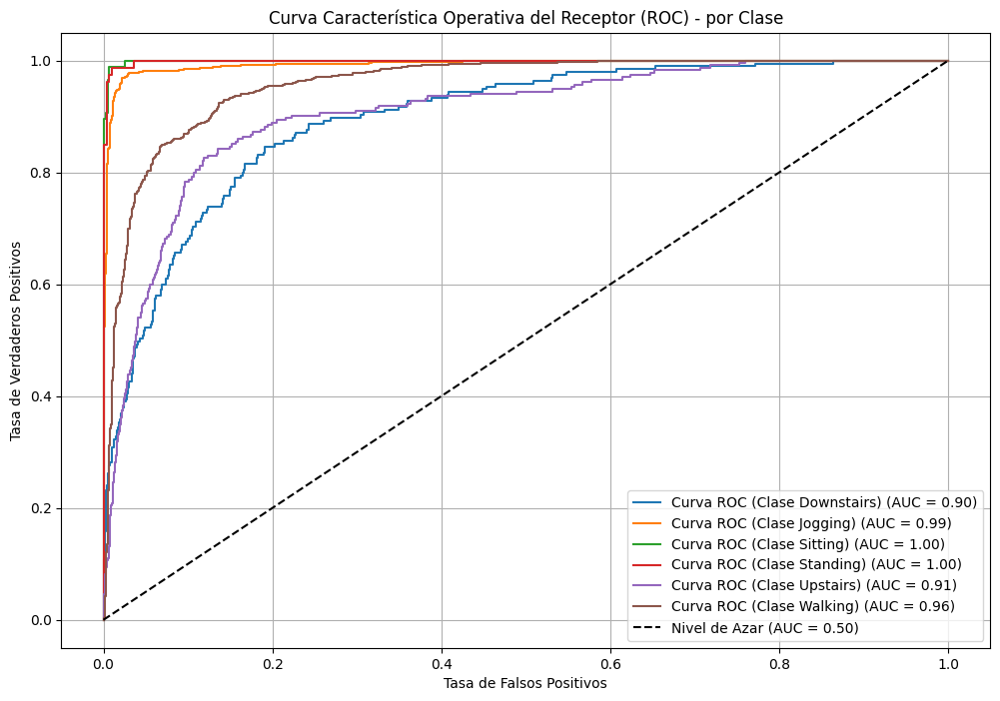

In [ ]:
# Con ayuda de Gemini

from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc as auc_function # Alias para evitar conflicto de nombres

# Obtener las clases únicas del modelo ajustado
classes = rlogit_sin_penal.classes_

# Binarizar las etiquetas verdaderas para un enfoque uno-contra-el-resto
y_test_binarized = label_binarize(y_test.values.ravel(), classes=classes)

# Asegurarse de que y_pred_prob_sin esté definido (se define en la celda anterior que calcula las métricas)
# y_pred_prob_sin = rlogit_sin_penal.predict_proba(X_test)

plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes):
    # Calcular la curva ROC para cada clase
    fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_pred_prob_sin[:, i])
    roc_auc_per_class = auc_function(fpr, tpr) # Usar el alias de la función
    plt.plot(fpr, tpr, label=f'Curva ROC (Clase {class_name}) (AUC = {roc_auc_per_class:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Nivel de Azar (AUC = 0.50)')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva Característica Operativa del Receptor (ROC) - por Clase')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [ ]:
# 1. Tomar los IDs de user_snippet desde metadata_kaggle
ids = metadata_kaggleRLogistica['user_snippet'].reset_index(drop=True)

# 2. Variables explicativas SIN user_snippet
X_predi = metadata_kaggleRLogistica_limpia.drop(columns=['user_snippet'])

# 3. Tomar predicción
pred_kaggle = rlogit_sin_penal.predict(X_predi)

# 4. Convertir las predicciones a DataFrame
resRLsin = pd.DataFrame({
    'user_snippet': ids,
    'pred_activity': pred_kaggle
})

# Guardar en CSV con el formato requerido para subir a Kaggle para la competencia
resRLsin.to_csv('predictions_IvHubMetrics.csv', index=False)

# Modelo subido el 19/11/2025

***Sin penalización y sin mezclar (shuffle) metadata y metadata_test - Método de validación split***

In [ ]:
c_drop = [
    'x-axis__sum_values', 'y-axis__sum_values', 'z-axis__sum_values',
    'x-axis__variance', 'y-axis__variance', 'z-axis__variance',
    'x-axis__length', 'y-axis__length', 'z-axis__length'
]

metadataRLogistica_limpia = metadataRLogistica.drop(columns=c_drop)
metadataRLogistica_limpia.columns

Index(['user_snippet', 'x-axis__median', 'x-axis__mean',
       'x-axis__standard_deviation', 'x-axis__root_mean_square',
       'x-axis__maximum', 'x-axis__absolute_maximum', 'x-axis__minimum',
       'y-axis__median', 'y-axis__mean', 'y-axis__standard_deviation',
       'y-axis__root_mean_square', 'y-axis__maximum',
       'y-axis__absolute_maximum', 'y-axis__minimum', 'z-axis__median',
       'z-axis__mean', 'z-axis__standard_deviation',
       'z-axis__root_mean_square', 'z-axis__maximum',
       'z-axis__absolute_maximum', 'z-axis__minimum', 'activity'],
      dtype='object')

In [ ]:
metadataRLogistica_limpia.shape

(6310, 23)

In [ ]:
c_drop = [
    'x-axis__sum_values', 'y-axis__sum_values', 'z-axis__sum_values',
    'x-axis__variance', 'y-axis__variance', 'z-axis__variance',
    'x-axis__length', 'y-axis__length', 'z-axis__length'
]

metadata_testRLogistica_limpia = metadata_testRLogistica.drop(columns=c_drop)
metadata_testRLogistica_limpia.columns

Index(['user_snippet', 'x-axis__median', 'x-axis__mean',
       'x-axis__standard_deviation', 'x-axis__root_mean_square',
       'x-axis__maximum', 'x-axis__absolute_maximum', 'x-axis__minimum',
       'y-axis__median', 'y-axis__mean', 'y-axis__standard_deviation',
       'y-axis__root_mean_square', 'y-axis__maximum',
       'y-axis__absolute_maximum', 'y-axis__minimum', 'z-axis__median',
       'z-axis__mean', 'z-axis__standard_deviation',
       'z-axis__root_mean_square', 'z-axis__maximum',
       'z-axis__absolute_maximum', 'z-axis__minimum', 'activity'],
      dtype='object')

In [ ]:
metadata_testRLogistica_limpia.shape

(1934, 23)

In [ ]:
# Variable objetivo
y_train = metadataRLogistica_limpia[['activity']]
y_test = metadata_testRLogistica_limpia[['activity']]

# Variables explicativas (excluyendo 'user_snippet' y 'activity' por el slicing iloc) Acá también se está excluyendo automáticamente la actividad por el iloc.
X_train = metadataRLogistica_limpia.iloc[:, 1:22]
X_test = metadata_testRLogistica_limpia.iloc[:, 1:22]

# Conjunto de predicción (excluyendo 'user_snippet' por el slicing iloc) Acá también se está excluyendo automáticamente la actividad por el iloc.
X_predi = metadata_kaggleRLogistica_limpia.iloc[:, 1:22]

In [ ]:
# Sin penalización
RLno_mezcla = Pipeline([
    ('logreg', LogisticRegression(
        penalty=None,     # Sin regularización
        max_iter=1000,      # Garantizar convergencia
        solver='lbfgs',     # Método de Regresión Logística
        multi_class='ovr'   # Multiclase (one-vs-rest)
    ))
])


In [ ]:
# Entrenar
RLno_mezcla.fit(X_train, y_train)

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Pipeline(steps=[('logreg',
                 LogisticRegression(max_iter=1000, multi_class='ovr',
                                    penalty=None))])

In [ ]:
# Predecir en test
y_predNoMezcla = RLno_mezcla.predict(X_test)

In [ ]:
# Evaluación
print("Matriz de confusión:")
print(confusion_matrix(y_test, y_predNoMezcla))

Matriz de confusión:
[[ 22   2   0   0   5 145]
 [  0 670   0   0   1  18]
 [  1   0  21   0   0   0]
 [  0   0  18  18   2   5]
 [ 15  31   0   1  42 149]
 [ 42  48   0   0   8 670]]


In [ ]:
print("\nReporte de clasificación:")
print(classification_report(y_test, y_predNoMezcla))


Reporte de clasificación:
              precision    recall  f1-score   support

  Downstairs       0.28      0.13      0.17       174
     Jogging       0.89      0.97      0.93       689
     Sitting       0.54      0.95      0.69        22
    Standing       0.95      0.42      0.58        43
    Upstairs       0.72      0.18      0.28       238
     Walking       0.68      0.87      0.76       768

    accuracy                           0.75      1934
   macro avg       0.68      0.59      0.57      1934
weighted avg       0.73      0.75      0.71      1934



In [ ]:
print("Accuracy: ", accuracy_score(y_test, y_predNoMezcla))
print("Precision: ", precision_score(y_test, y_predNoMezcla, average='weighted'))
print("Recall: ", recall_score(y_test, y_predNoMezcla, average='weighted'))
print("F1: ", f1_score(y_test, y_predNoMezcla, average='weighted'))
#predNoMezcla = RLno_mezcla.predict_proba(X_test)
#print("AUC: ", roc_auc_score(y_test, predNoMezcla, multi_class='ovr', average='weighted'))

Accuracy:  0.7461220268872802
Precision:  0.7284396553485057
Recall:  0.7461220268872802
F1:  0.705968715570856


In [ ]:
#Función de pérdida Cross Entropy sin mezcla y sin penalización

y_test_flat = y_test.values.ravel()

# Usar predicción de probabilidad
y_pred_probsinmez = RLno_mezcla.predict_proba(X_test)

cross_entropy_sinMezclaSinPenali = log_loss(y_test_flat, y_pred_probsinmez)

print(f"Cross-Entropy función de pérdida de logit_cvRidge model (scoring='roc_auc_ovr'): {cross_entropy_sinMezclaSinPenali:.4f}")

Cross-Entropy función de pérdida de logit_cvRidge model (scoring='roc_auc_ovr'): 0.9204


In [ ]:
# Ensure pipe is defined and fitted before use
pipe = Pipeline([
    ('logreg', LogisticRegression(
        penalty=None,
        max_iter=1000,
        solver='lbfgs',
        multi_class='ovr'
    ))
])
pipe.fit(X_train, y_train)

# Calculate prediction probabilities for multiclass AUC
y_pred_probsinmez = pipe.predict_proba(X_test)

# Calculate multiclass ROC AUC using 'one-vs-rest' strategy
macro_auc = roc_auc_score(y_test.values.ravel(), y_pred_probsinmez, multi_class='ovr', average='macro')

print("AUC (macro):", macro_auc)

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


AUC (macro): 0.9229257044437594


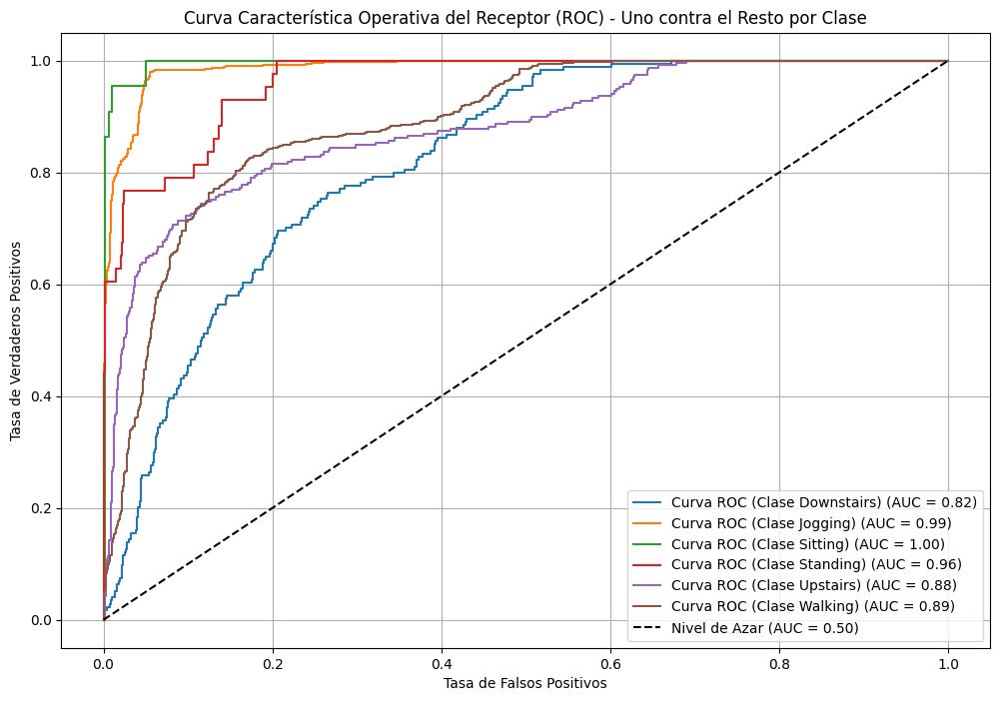

In [ ]:
# Con ayuda de Gemini

from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc as auc_function # Alias para evitar conflicto de nombres

# Obtener las clases únicas del modelo ajustado
classes = rlogit_sin_penal.classes_

# Binarizar las etiquetas verdaderas para un enfoque uno-contra-el-resto
y_test_binarized = label_binarize(y_test.values.ravel(), classes=classes)

# Asegurarse de que y_pred_probsinmez_sin esté definido (se define en la celda anterior que calcula las métricas)
# y_pred_probsinmez = rlogit_sin_penal.predict_proba(X_test)

plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes):
    # Calcular la curva ROC para cada clase
    fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_pred_probsinmez[:, i])
    roc_auc_per_class = auc_function(fpr, tpr) # Usar el alias de la función
    plt.plot(fpr, tpr, label=f'Curva ROC (Clase {class_name}) (AUC = {roc_auc_per_class:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Nivel de Azar (AUC = 0.50)')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva Característica Operativa del Receptor (ROC) - Uno contra el Resto por Clase')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [ ]:
# Tomar los IDs de user_snippet desde metadata_kaggleRLogistica_limpia
ids = metadata_kaggleRLogistica_limpia['user_snippet']

# Definir X_predi a partir de metadata_kaggleRLogistica_limpia (excluyendo 'user_snippet')
X_predi = metadata_kaggleRLogistica_limpia.drop(columns=['user_snippet'])

# Generar predicciones usando el modelo 'pipe' (Regresión Logística sin penalización)
pred_kaggle = pipe.predict(X_predi)

# Crear el DataFrame de resultados con los user_snippet y las predicciones
pred_df = pd.DataFrame({
    'user_snippet': ids,
    'activity': pred_kaggle
})

# Mostrar las primeras filas del DataFrame de predicciones
print("Primeras 5 predicciones de Regresión Logística (sin penalización) para Kaggle:")
print(pred_df.head())

# Guardar las predicciones en un archivo CSV
pred_df.to_csv('predictions_IvHubMetrics.csv', index=False)
#print("Predicciones guardadas en 'predictions_IvHubMetrics.csv'")

# Modelo subido el 19/11/2025

Primeras 5 predicciones de Regresión Logística (sin penalización) para Kaggle:
  user_snippet  activity
0       8054_0   Walking
1       8054_1   Sitting
2       8054_2   Walking
3       8054_3  Standing
4       8054_4   Walking


***Con penalización y sin mezclar (shuffle) metadata y metadata_test - Método de validación split***

**RIDGE**

In [ ]:
# Con penalización Ridge (L2)
pipe_ridge = Pipeline([
    ('logreg', LogisticRegression(
    penalty='l2',
    C=1.0,
    solver='lbfgs',
    max_iter=1000,
    multi_class='ovr'
 ))
])

# Entrenar el modelo con penalización Ridge
pipe_ridge.fit(X_train, y_train)

# Predecir en el conjunto de prueba
y_pred_ridge = pipe_ridge.predict(X_test)

# Evaluar el modelo Ridge
print("\n--- Modelo de Regresión Logística con Penalización Ridge ---")
print("Matriz de Confusión:")
print(confusion_matrix(y_test, y_pred_ridge))
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_ridge))

y_pred_prob_ridge = pipe_ridge.predict_proba(X_test)
macro_auc_ridge = roc_auc_score(y_test.values.ravel(), y_pred_prob_ridge, multi_class='ovr', average='macro')
print("AUC (macro) Ridge:", macro_auc_ridge)


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(



--- Modelo de Regresión Logística con Penalización Ridge ---
Matriz de Confusión:
[[ 22   2   0   0   5 145]
 [  0 671   0   0   1  17]
 [  1   0  21   0   0   0]
 [  0   0  18  18   1   6]
 [ 16  31   0   0  42 149]
 [ 43  47   0   0   8 670]]

Reporte de Clasificación:
              precision    recall  f1-score   support

  Downstairs       0.27      0.13      0.17       174
     Jogging       0.89      0.97      0.93       689
     Sitting       0.54      0.95      0.69        22
    Standing       1.00      0.42      0.59        43
    Upstairs       0.74      0.18      0.28       238
     Walking       0.68      0.87      0.76       768

    accuracy                           0.75      1934
   macro avg       0.69      0.59      0.57      1934
weighted avg       0.73      0.75      0.71      1934

AUC (macro) Ridge: 0.9143067849848507


In [ ]:
#Función de pérdida Cross Entropy sin mezcla con Ridge

y_test_flat = y_test.values.ravel()

# Usar predicción de probabilidad
y_pred_prob_ridge = pipe_ridge.predict_proba(X_test)

cross_entropy_sinMezclaRidge = log_loss(y_test_flat, y_pred_prob_ridge)

print(f"Cross-Entropy función de pérdida de logit_cvRidge model (scoring='roc_auc_ovr'): {cross_entropy_sinMezclaRidge:.4f}")

Cross-Entropy función de pérdida de logit_cvRidge model (scoring='roc_auc_ovr'): 0.7502


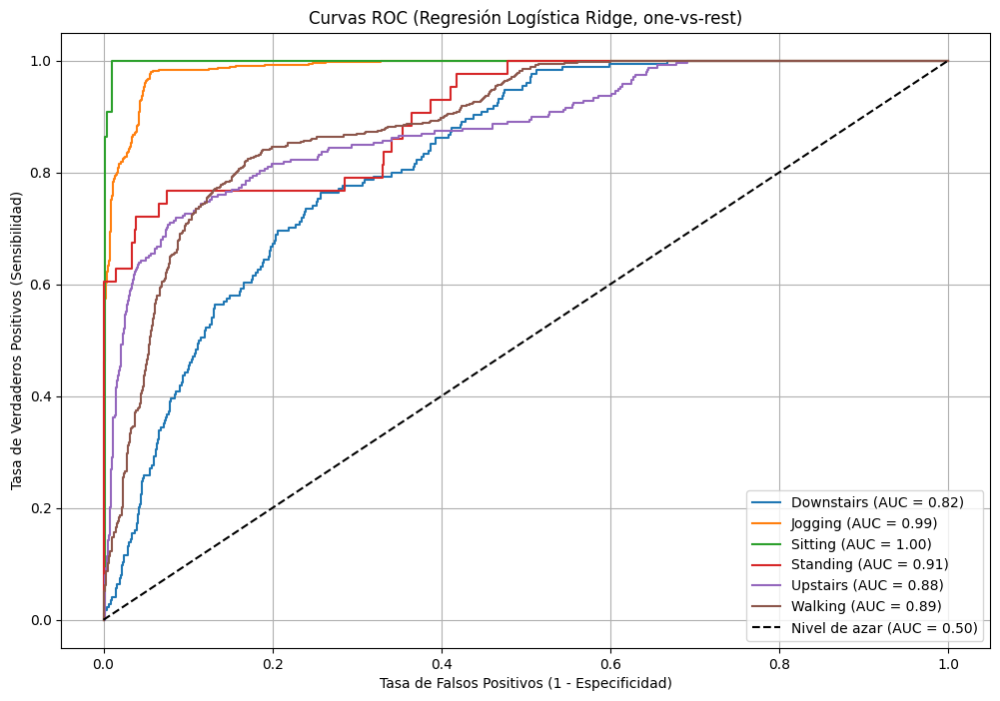

In [ ]:
# Con ayuda de Gemini

from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc as auc_function # Alias para evitar conflicto de nombres

# Obtener las clases únicas del modelo ajustado
classes = pipe_ridge.named_steps['logreg'].classes_

# Binarizar las etiquetas verdaderas para un enfoque uno-contra-el-resto
y_test_binarized = label_binarize(y_test.values.ravel(), classes=classes)

# Asegurarse de que y_pred_probsinmez_sin esté definido (se define en la celda anterior que calcula las métricas)
# y_pred_probsinmez = rlogit_sin_penal.predict_proba(X_test)

y_pred_prob_ridge = pipe_ridge.predict_proba(X_test)

plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes):
    # Calcular la curva ROC para cada clase
    fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_pred_prob_ridge[:, i])
    roc_auc_per_class = auc(fpr, tpr) # Usar el alias de la función
    plt.plot(fpr, tpr, label=f'{class_name} (AUC = {roc_auc_per_class:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Nivel de azar (AUC = 0.50)')

plt.xlabel('Tasa de Falsos Positivos (1 - Especificidad)')
plt.ylabel('Tasa de Verdaderos Positivos (Sensibilidad)')
plt.title('Curvas ROC (Regresión Logística Ridge, one-vs-rest)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [ ]:
# Tomar los IDs de user_snippet desde metadata_kaggleRLogistica_limpia
ids = metadata_kaggleRLogistica_limpia['user_snippet']

# Definir X_predi a partir de metadata_kaggleRLogistica_limpia (excluyendo 'user_snippet')
X_predi = metadata_kaggleRLogistica_limpia.drop(columns=['user_snippet'])

# Generar predicciones usando el modelo 'pipe' (Regresión Logística sin penalización)
pred_kaggle = pipe_ridge.predict(X_predi)

# Crear el DataFrame de resultados con los user_snippet y las predicciones
pred_df = pd.DataFrame({
    'user_snippet': ids,
    'activity': pred_kaggle
})

# Mostrar las primeras filas del DataFrame de predicciones
print("Primeras 5 predicciones de Regresión Logística con penalización Ridge para Kaggle:")
print(pred_df.head())

# Guardar las predicciones en un archivo CSV
pred_df.to_csv('predictions_IvHubMetrics.csv', index=False)
#print("Predicciones guardadas en 'predictions_IvHubMetrics.csv'")

# Modelo subido el 22/11/2025

Primeras 5 predicciones de Regresión Logística con penalización Ridge para Kaggle:
  user_snippet  activity
0       8054_0   Walking
1       8054_1   Sitting
2       8054_2   Walking
3       8054_3  Standing
4       8054_4   Walking


**LASSO C=1**

In [ ]:
# Con penalización Lasso (L1)
pipe_lasso = Pipeline([
    ('logreg', LogisticRegression(
        penalty='l1',      # LASSO
        C=1.0,             # Fuerza de regularización (menor C = más penalización)
        solver='liblinear',# Este solver soporta L1
        max_iter=1000,
        multi_class='ovr'  # Multiclase (One-vs-Rest)
    ))
])

# Entrenar el modelo con penalización Lasso
pipe_lasso.fit(X_train, y_train)

# Predecir en el conjunto de prueba
y_pred_lasso = pipe_lasso.predict(X_test)
y_pred_prob_lasso = pipe_lasso.predict_proba(X_test)

# Evaluar el modelo Lasso
print("\n Modelo de Regresión Logística con Penalización Lasso ")
print("Matriz de Confusión:")
print(confusion_matrix(y_test, y_pred_lasso))
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_lasso))

y_pred_prob_lasso = pipe_lasso.predict_proba(X_test)
macro_auc_lasso = roc_auc_score(y_test.values.ravel(), y_pred_prob_lasso, multi_class='ovr', average='macro')
print("AUC (macro) Lasso:", macro_auc_lasso)


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(



 Modelo de Regresión Logística con Penalización Lasso 
Matriz de Confusión:
[[ 21   2   0   0   6 145]
 [  0 673   0   0   1  15]
 [  1   0  21   0   0   0]
 [  0   0  18  18   1   6]
 [ 15  31   0   0  40 152]
 [ 41  49   0   0   8 670]]

Reporte de Clasificación:
              precision    recall  f1-score   support

  Downstairs       0.27      0.12      0.17       174
     Jogging       0.89      0.98      0.93       689
     Sitting       0.54      0.95      0.69        22
    Standing       1.00      0.42      0.59        43
    Upstairs       0.71      0.17      0.27       238
     Walking       0.68      0.87      0.76       768

    accuracy                           0.75      1934
   macro avg       0.68      0.59      0.57      1934
weighted avg       0.73      0.75      0.70      1934

AUC (macro) Lasso: 0.9147514310491275


In [ ]:
#Función de pérdida Cross Entropy con Lasso

y_test_flat = y_test.values.ravel()
cross_entropy_lasso = log_loss(y_test_flat, y_pred_prob_lasso)
print(f"Cross-Entropy (función de pérdida) para Lasso: {cross_entropy_lasso:.4f}")

print(f"Cross-Entropy función de pérdida para Regresión Logística con penalización Lasso: {cross_entropy_lasso:.4f}")

Cross-Entropy (función de pérdida) para Lasso: 0.7588
Cross-Entropy función de pérdida para Regresión Logística con penalización Lasso: 0.7588


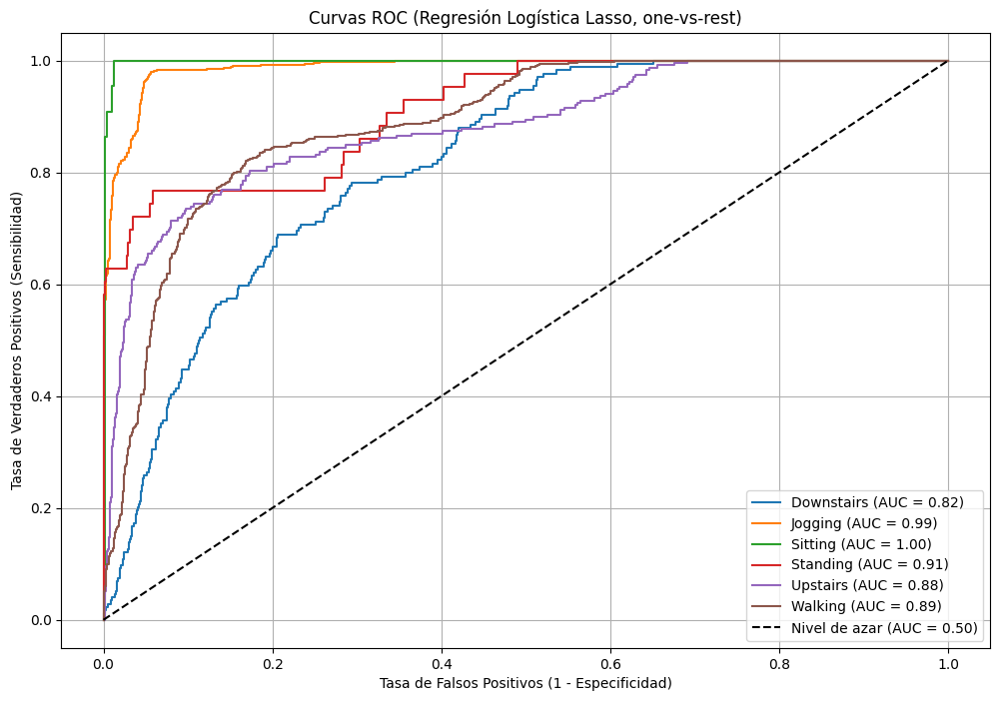

In [ ]:
# Con ayuda de Gemini

from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc as auc_function # Alias para evitar conflicto de nombres

# Obtener las clases únicas del modelo ajustado
classes = pipe_lasso.named_steps['logreg'].classes_

# Binarizar las etiquetas verdaderas para un enfoque uno-contra-el-resto
y_test_binarized = label_binarize(y_test.values.ravel(), classes=classes)

y_pred_prob_lasso = pipe_lasso.predict_proba(X_test)

plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes):
    # Calcular la curva ROC para cada clase
    fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_pred_prob_lasso[:, i])
    roc_auc_per_class = auc(fpr, tpr) # Usar el alias de la función
    plt.plot(fpr, tpr, label=f'{class_name} (AUC = {roc_auc_per_class:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Nivel de azar (AUC = 0.50)')

plt.xlabel('Tasa de Falsos Positivos (1 - Especificidad)')
plt.ylabel('Tasa de Verdaderos Positivos (Sensibilidad)')
plt.title('Curvas ROC (Regresión Logística Lasso, one-vs-rest)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


In [ ]:
# Tomar los IDs de user_snippet desde metadata_kaggleRLogistica_limpia
ids = metadata_kaggleRLogistica_limpia['user_snippet']

# Definir X_predi a partir de metadata_kaggleRLogistica_limpia (excluyendo 'user_snippet')
X_predi = metadata_kaggleRLogistica_limpia.drop(columns=['user_snippet'])

# Generar predicciones usando el modelo 'pipe' (Regresión Logística sin penalización)
pred_kaggle = pipe_lasso.predict(X_predi)

# Crear el DataFrame de resultados con los user_snippet y las predicciones
pred_df = pd.DataFrame({
    'user_snippet': ids,
    'activity': pred_kaggle
})

# Mostrar las primeras filas del DataFrame de predicciones
print("Primeras 5 predicciones de Regresión Logística con penalización Lasso para Kaggle:")
print(pred_df.head())

# Guardar las predicciones en un archivo CSV
pred_df.to_csv('predictions_IvHubMetrics.csv', index=False)
#print("Predicciones guardadas en 'predictions_IvHubMetrics.csv'")

# Modelo subido el 22/11/2025

Primeras 5 predicciones de Regresión Logística con penalización Lasso para Kaggle:
  user_snippet  activity
0       8054_0   Walking
1       8054_1   Sitting
2       8054_2   Walking
3       8054_3  Standing
4       8054_4   Walking


**LASSO Cambio C**

In [ ]:
# Con penalización Lasso (L1)
pipe_lasso = Pipeline([
    ('logreg', LogisticRegression(
        penalty='l1',      # LASSO
        C=0.1,             # Fuerza de regularización (menor C = más penalización)
        solver='liblinear',# Este solver soporta L1
        max_iter=5000,
        multi_class='ovr'  # Multiclase (One-vs-Rest)
    ))
])

# Entrenar el modelo con penalización Lasso
pipe_lasso.fit(X_train, y_train)

# Predecir en el conjunto de prueba
y_pred_lasso = pipe_lasso.predict(X_test)
y_pred_prob_lasso = pipe_lasso.predict_proba(X_test)

# Evaluar el modelo Lasso
print("\n Modelo de Regresión Logística con Penalización Lasso ")
print("Matriz de Confusión:")
print(confusion_matrix(y_test, y_pred_lasso))
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_lasso))

y_pred_prob_lasso = pipe_lasso.predict_proba(X_test)
macro_auc_lasso = roc_auc_score(y_test.values.ravel(), y_pred_prob_lasso, multi_class='ovr', average='macro')
print("AUC (macro) Lasso:", macro_auc_lasso)


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(



 Modelo de Regresión Logística con Penalización Lasso 
Matriz de Confusión:
[[ 26   1   0   0   6 141]
 [  0 676   0   0   1  12]
 [  1   0  21   0   0   0]
 [  0   0  21  21   1   0]
 [ 17  32   0   0  80 109]
 [ 41  25   0   0   8 694]]

Reporte de Clasificación:
              precision    recall  f1-score   support

  Downstairs       0.31      0.15      0.20       174
     Jogging       0.92      0.98      0.95       689
     Sitting       0.50      0.95      0.66        22
    Standing       1.00      0.49      0.66        43
    Upstairs       0.83      0.34      0.48       238
     Walking       0.73      0.90      0.81       768

    accuracy                           0.78      1934
   macro avg       0.71      0.64      0.62      1934
weighted avg       0.77      0.78      0.76      1934

AUC (macro) Lasso: 0.9366457644390408


In [ ]:
#Función de pérdida Cross Entropy con Lasso

y_test_flat = y_test.values.ravel()
cross_entropy_lasso = log_loss(y_test_flat, y_pred_prob_lasso)
print(f"Cross-Entropy (función de pérdida) para Lasso: {cross_entropy_lasso:.4f}")

print(f"Cross-Entropy función de pérdida para Regresión Logística con penalización Lasso: {cross_entropy_lasso:.4f}")

Cross-Entropy (función de pérdida) para Lasso: 0.6117
Cross-Entropy función de pérdida para Regresión Logística con penalización Lasso: 0.6117


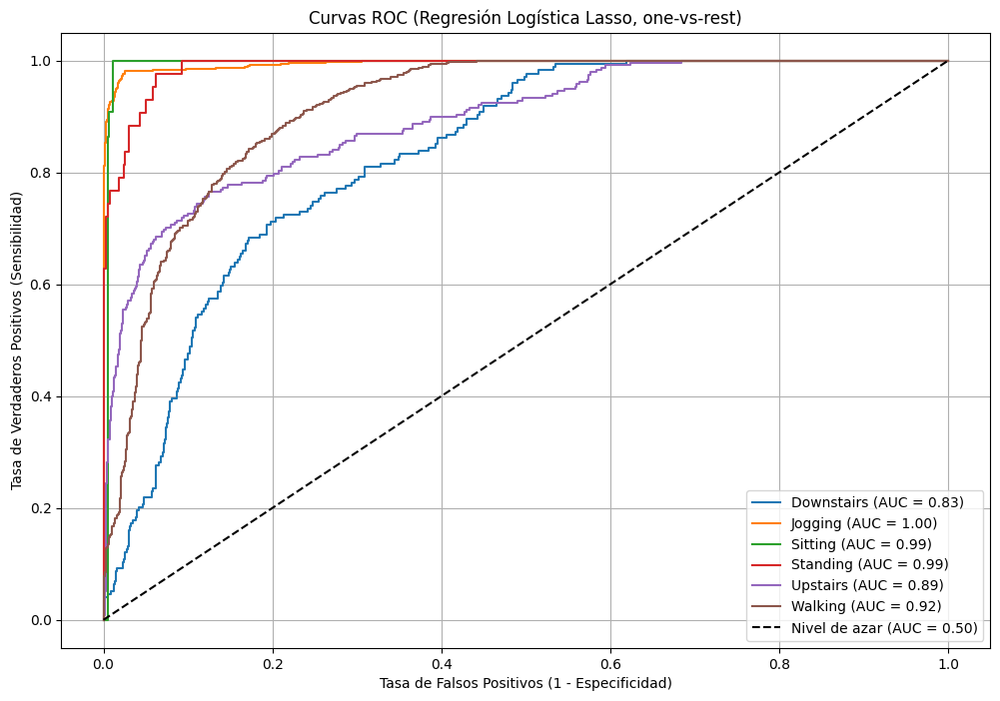

In [ ]:
# Con ayuda de Gemini

from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc as auc_function # Alias para evitar conflicto de nombres

# Obtener las clases únicas del modelo ajustado
classes = pipe_lasso.named_steps['logreg'].classes_

# Binarizar las etiquetas verdaderas para un enfoque uno-contra-el-resto
y_test_binarized = label_binarize(y_test.values.ravel(), classes=classes)

y_pred_prob_lasso = pipe_lasso.predict_proba(X_test)

plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes):
    # Calcular la curva ROC para cada clase
    fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_pred_prob_lasso[:, i])
    roc_auc_per_class = auc(fpr, tpr) # Usar el alias de la función
    plt.plot(fpr, tpr, label=f'{class_name} (AUC = {roc_auc_per_class:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Nivel de azar (AUC = 0.50)')

plt.xlabel('Tasa de Falsos Positivos (1 - Especificidad)')
plt.ylabel('Tasa de Verdaderos Positivos (Sensibilidad)')
plt.title('Curvas ROC (Regresión Logística Lasso, one-vs-rest)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


In [ ]:
# Tomar los IDs de user_snippet desde metadata_kaggleRLogistica_limpia
ids = metadata_kaggleRLogistica_limpia['user_snippet']

# Definir X_predi a partir de metadata_kaggleRLogistica_limpia (excluyendo 'user_snippet')
X_predi = metadata_kaggleRLogistica_limpia.drop(columns=['user_snippet'])

# --- Start of fix to address feature mismatch error ---

# Re-create the `c_drop` list for consistency if it's not globally defined.
c_drop_local = [
    'x-axis__sum_values', 'y-axis__sum_values', 'z-axis__sum_values',
    'x-axis__variance', 'y-axis__variance', 'z-axis__variance',
    'x-axis__length', 'y-axis__length', 'z-axis__length'
]

# Ensure `metadataRLogistica` is the original full metadata for training
# This assumes metadataRLogistica is available in the global scope
metadataRLogistica_limpia_rederived = metadataRLogistica.drop(columns=c_drop_local)

# Define X_train and y_train with the *cleaned* features, consistent with X_predi
# metadataRLogistica_limpia_rederived has 'user_snippet' at index 0 and 'activity' at index 22
X_train_corrected = metadataRLogistica_limpia_rederived.iloc[:, 1:22]
y_train_corrected = metadataRLogistica_limpia_rederived[['activity']]

# Re-initialize the pipe_lasso model to ensure it doesn't carry over previous inconsistent state
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

pipe_lasso = Pipeline([
    ('logreg', LogisticRegression(
        penalty='l1',      # LASSO
        C=0.1,             # Force regularization as per the cell's section
        solver='liblinear',# Solver supporting L1
        max_iter=5000,
        multi_class='ovr'  # Multiclass (One-vs-Rest)
    ))
])

# Re-fit the pipe_lasso model with the explicitly corrected X_train and y_train
pipe_lasso.fit(X_train_corrected, y_train_corrected)

# --- End of fix ---

# Generar predicciones usando el modelo 'pipe_lasso'
pred_kaggle = pipe_lasso.predict(X_predi)

# Crear el DataFrame de resultados con los user_snippet y las predicciones
pred_df = pd.DataFrame({
    'user_snippet': ids,
    'activity': pred_kaggle
})

# Mostrar las primeras filas del DataFrame de predicciones
print("Primeras 5 predicciones de Regresión Logística con penalización Lasso para Kaggle:")
print(pred_df.head())

# Guardar las predicciones en un archivo CSV
pred_df.to_csv('predictions_IvHubMetrics.csv', index=False)
#print("Predicciones guardadas en 'predictions_IvHubMetrics.csv'")

# Modelo subido el 27/11/2025

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Primeras 5 predicciones de Regresión Logística con penalización Lasso para Kaggle:
  user_snippet  activity
0       8054_0   Walking
1       8054_1   Sitting
2       8054_2   Walking
3       8054_3  Standing
4       8054_4   Walking


***Con penalización - Método de validación Cross Validation (por defecto con mezcla)***

In [ ]:
# Separación
y = metadata_unionRLogistica_limpia['activity'].to_numpy()
X = metadata_unionRLogistica_limpia.drop(columns=['activity', 'user_snippet']).to_numpy()

**`Ridge Cross Validation 5 K-Fold - Accuracy`**

In [ ]:
logit_cvRidge = LogisticRegressionCV(
    penalty='l2',
    solver='lbfgs', # Método Newton utilizado cuando hay muchas clases
    cv=5, # 5 k-fold
    scoring='accuracy',
    max_iter=2000,
    multi_class='ovr'
)

logit_cvRidge.fit(X, y)


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1917: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegressionCV(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


LogisticRegressionCV(cv=5, max_iter=2000, multi_class='ovr', scoring='accuracy')

In [ ]:
X_kaggle = metadata_kaggleRLogistica_limpia.drop(columns=['user_snippet']).to_numpy()
pred_kaggle = logit_cvRidge.predict(X_kaggle)

In [ ]:
# Predecir en el conjunto de prueba usando el modelo logit_cvRidge
y_pred_cvRidge = logit_cvRidge.predict(X_test)

print("Evaluación del Modelo de Regresión Logística con Penalización Ridge y Cross-Validation")

# Matriz de Confusión
conf_matrix_cvRidge = confusion_matrix(y_test, y_pred_cvRidge)
print("\nMatriz de Confusión:")
print(conf_matrix_cvRidge)

# Reporte de Clasificación (incluye Precision, Recall, F1-score)
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_cvRidge))

# Métricas explícitas
accuracy_cvRidge = accuracy_score(y_test, y_pred_cvRidge)
precision_weighted_cvRidge = precision_score(y_test, y_pred_cvRidge, average='weighted')
recall_weighted_cvRidge = recall_score(y_test, y_pred_cvRidge, average='weighted')
f1_weighted_cvRidge = f1_score(y_test, y_pred_cvRidge, average='weighted')

print(f"\nAccuracy: {accuracy_cvRidge:.4f}")
print(f"Precision (Weighted): {precision_weighted_cvRidge:.4f}")
print(f"Recall (Weighted) / Sensibilidad: {recall_weighted_cvRidge:.4f}")
print(f"F1-Score (Weighted): {f1_weighted_cvRidge:.4f}")

# Calcular Especificidad (Specificity) para cada clase
classes_cvRidge = logit_cvRidge.classes_
print("\nEspecificidad (Specificity) por Clase:")
for i, class_label in enumerate(classes_cvRidge):
    true_negatives = conf_matrix_cvRidge.sum() - conf_matrix_cvRidge[i, :].sum() - conf_matrix_cvRidge[:, i].sum() + conf_matrix_cvRidge[i, i]
    false_positives = conf_matrix_cvRidge[:, i].sum() - conf_matrix_cvRidge[i, i]

    specificity = true_negatives / (true_negatives + false_positives) if (true_negatives + false_positives) > 0 else 0
    print(f"  {class_label}: {specificity:.4f}")

# Calcular AUC si es posible (requiere predict_proba)

try:
    y_pred_prob_cvRidge = logit_cvRidge.predict_proba(X_test)
    macro_auc_cvRidge = roc_auc_score(y_test.values.ravel(), y_pred_prob_cvRidge, multi_class='ovr', average='macro')
    print(f"\nAUC (macro) CV Ridge: {macro_auc_cvRidge:.4f}")
except Exception as e:
    print(f"\nCould not calculate AUC: {e}")

Evaluación del Modelo de Regresión Logística con Penalización Ridge y Cross-Validation

Matriz de Confusión:
[[ 16   1   0   0   6 151]
 [  0 676   0   0   1  12]
 [  1   0  21   0   0   0]
 [  0   0   5  32   3   3]
 [ 13  30   0   0  61 134]
 [ 37  32   0   0  14 685]]

Reporte de Clasificación:
              precision    recall  f1-score   support

  Downstairs       0.24      0.09      0.13       174
     Jogging       0.91      0.98      0.95       689
     Sitting       0.81      0.95      0.88        22
    Standing       1.00      0.74      0.85        43
    Upstairs       0.72      0.26      0.38       238
     Walking       0.70      0.89      0.78       768

    accuracy                           0.77      1934
   macro avg       0.73      0.65      0.66      1934
weighted avg       0.74      0.77      0.73      1934


Accuracy: 0.7709
Precision (Weighted): 0.7433
Recall (Weighted) / Sensibilidad: 0.7709
F1-Score (Weighted): 0.7350

Especificidad (Specificity) por Clase:
  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegressionCV was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegressionCV was fitted without feature names
  warnings.warn(


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegressionCV was fitted without feature names
  warnings.warn(


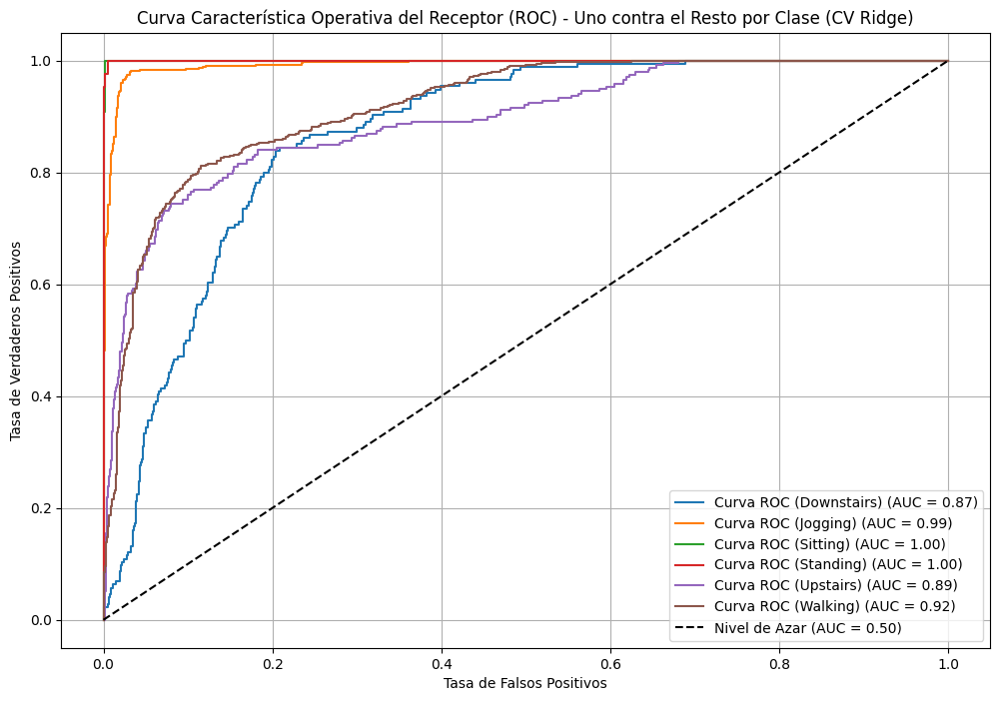

In [ ]:
# Obtener las clases únicas del modelo ajustado
classes_cvRidge = logit_cvRidge.classes_

# Binarizar las etiquetas verdaderas para un enfoque uno-contra-el-resto
y_test_binarized_cvRidge = label_binarize(y_test.values.ravel(), classes=classes_cvRidge)

# Obtener las probabilidades de predicción
y_pred_prob_cvRidge = logit_cvRidge.predict_proba(X_test)

plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes_cvRidge):
    # Calcular la curva ROC para cada clase
    fpr, tpr, _ = roc_curve(y_test_binarized_cvRidge[:, i], y_pred_prob_cvRidge[:, i])
    roc_auc_per_class = auc_function(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Curva ROC ({class_name}) (AUC = {roc_auc_per_class:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Nivel de Azar (AUC = 0.50)')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva Característica Operativa del Receptor (ROC) - Uno contra el Resto por Clase (CV Ridge)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


In [ ]:
#Función de pérdida Cross Entropy

y_test_flat = y_test.values.ravel()

cross_entropy_cvRidge = log_loss(y_test_flat, y_pred_prob_cvRidge)

print(f"Cross-Entropy función de pérdida de logit_cvRidge model: {cross_entropy_cvRidge:.4f}")

Cross-Entropy función de pérdida de logit_cvRidge model: 0.5624


In [ ]:
# Tomar los IDs de user_snippet desde metadata_kaggleRLogistica_limpia
ids = metadata_kaggleRLogistica_limpia['user_snippet']

# Definir X_predi a partir de metadata_kaggleRLogistica_limpia (excluyendo 'user_snippet')
X_predi = metadata_kaggleRLogistica_limpia.drop(columns=['user_snippet'])

# Generar predicciones usando el modelo 'pipe' (Regresión Logística sin penalización)
pred_kaggle = logit_cvRidge.predict(X_predi)

# Crear el DataFrame de resultados con los user_snippet y las predicciones
pred_df = pd.DataFrame({
    'user_snippet': ids,
    'activity': pred_kaggle
})

# Mostrar las primeras filas del DataFrame de predicciones
print("Primeras 5 predicciones de Regresión Logística con penalización Lasso para Kaggle:")
print(pred_df.head())

# Guardar las predicciones en un archivo CSV
pred_df.to_csv('predictions_IvHubMetrics.csv', index=False)
#print("Predicciones guardadas en 'predictions_IvHubMetrics.csv'")

# Modelo subido el 23/11/2025

Primeras 5 predicciones de Regresión Logística con penalización Lasso para Kaggle:
  user_snippet  activity
0       8054_0  Upstairs
1       8054_1   Sitting
2       8054_2   Walking
3       8054_3  Standing
4       8054_4  Upstairs


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegressionCV was fitted without feature names
  warnings.warn(


**`Ridge Cross Validation 5 K-Fold - Recall`**

In [ ]:
logit_cvRidge = LogisticRegressionCV(
    penalty='l2',
    solver='lbfgs', # Método Newton utilizado cuando hay muchas clases
    cv=5, # 5 k-fold
    scoring='recall',
    max_iter=2000,
    multi_class='ovr'
)

logit_cvRidge.fit(X, y)


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1917: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegressionCV(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


LogisticRegressionCV(cv=5, max_iter=2000, multi_class='ovr', scoring='recall')

In [ ]:
X_kaggle = metadata_kaggleRLogistica_limpia.drop(columns=['user_snippet']).to_numpy()
pred_kaggle = logit_cvRidge.predict(X_kaggle)

In [ ]:
# Predecir en el conjunto de prueba usando el modelo logit_cvRidge
y_pred_cvRidge = logit_cvRidge.predict(X_test)

print("Evaluación del Modelo de Regresión Logística con Penalización Ridge y Cross-Validation")

# Matriz de Confusión
conf_matrix_cvRidge = confusion_matrix(y_test, y_pred_cvRidge)
print("\nMatriz de Confusión:")
print(conf_matrix_cvRidge)

# Reporte de Clasificación (incluye Precision, Recall, F1-score)
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_cvRidge))

# Métricas explícitas
accuracy_cvRidge = accuracy_score(y_test, y_pred_cvRidge)
precision_weighted_cvRidge = precision_score(y_test, y_pred_cvRidge, average='weighted')
recall_weighted_cvRidge = recall_score(y_test, y_pred_cvRidge, average='weighted')
f1_weighted_cvRidge = f1_score(y_test, y_pred_cvRidge, average='weighted')

print(f"\nAccuracy: {accuracy_cvRidge:.4f}")
print(f"Precision (Weighted): {precision_weighted_cvRidge:.4f}")
print(f"Recall (Weighted) / Sensibilidad: {recall_weighted_cvRidge:.4f}")
print(f"F1-Score (Weighted): {f1_weighted_cvRidge:.4f}")

# Calcular Especificidad (Specificity) para cada clase
classes_cvRidge = logit_cvRidge.classes_
print("\nEspecificidad (Specificity) por Clase:")
for i, class_label in enumerate(classes_cvRidge):
    true_negatives = conf_matrix_cvRidge.sum() - conf_matrix_cvRidge[i, :].sum() - conf_matrix_cvRidge[:, i].sum() + conf_matrix_cvRidge[i, i]
    false_positives = conf_matrix_cvRidge[:, i].sum() - conf_matrix_cvRidge[i, i]

    specificity = true_negatives / (true_negatives + false_positives) if (true_negatives + false_positives) > 0 else 0
    print(f"  {class_label}: {specificity:.4f}")

# Calcular AUC si es posible (requiere predict_proba)

try:
    y_pred_prob_cvRidge = logit_cvRidge.predict_proba(X_test)
    macro_auc_cvRidge = roc_auc_score(y_test.values.ravel(), y_pred_prob_cvRidge, multi_class='ovr', average='macro')
    print(f"\nAUC (macro) CV Ridge: {macro_auc_cvRidge:.4f}")
except Exception as e:
    print(f"\nCould not calculate AUC: {e}")

Evaluación del Modelo de Regresión Logística con Penalización Ridge y Cross-Validation

Matriz de Confusión:
[[ 22   1   0   0   7 144]
 [  0 676   0   0   1  12]
 [  1   0  21   0   0   0]
 [  0   0   5  32   3   3]
 [ 14  30   0   0  61 133]
 [ 40  32   0   0  12 684]]

Reporte de Clasificación:
              precision    recall  f1-score   support

  Downstairs       0.29      0.13      0.18       174
     Jogging       0.91      0.98      0.95       689
     Sitting       0.81      0.95      0.88        22
    Standing       1.00      0.74      0.85        43
    Upstairs       0.73      0.26      0.38       238
     Walking       0.70      0.89      0.78       768

    accuracy                           0.77      1934
   macro avg       0.74      0.66      0.67      1934
weighted avg       0.75      0.77      0.74      1934


Accuracy: 0.7735
Precision (Weighted): 0.7507
Recall (Weighted) / Sensibilidad: 0.7735
F1-Score (Weighted): 0.7401

Especificidad (Specificity) por Clase:
  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegressionCV was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegressionCV was fitted without feature names
  warnings.warn(


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegressionCV was fitted without feature names
  warnings.warn(


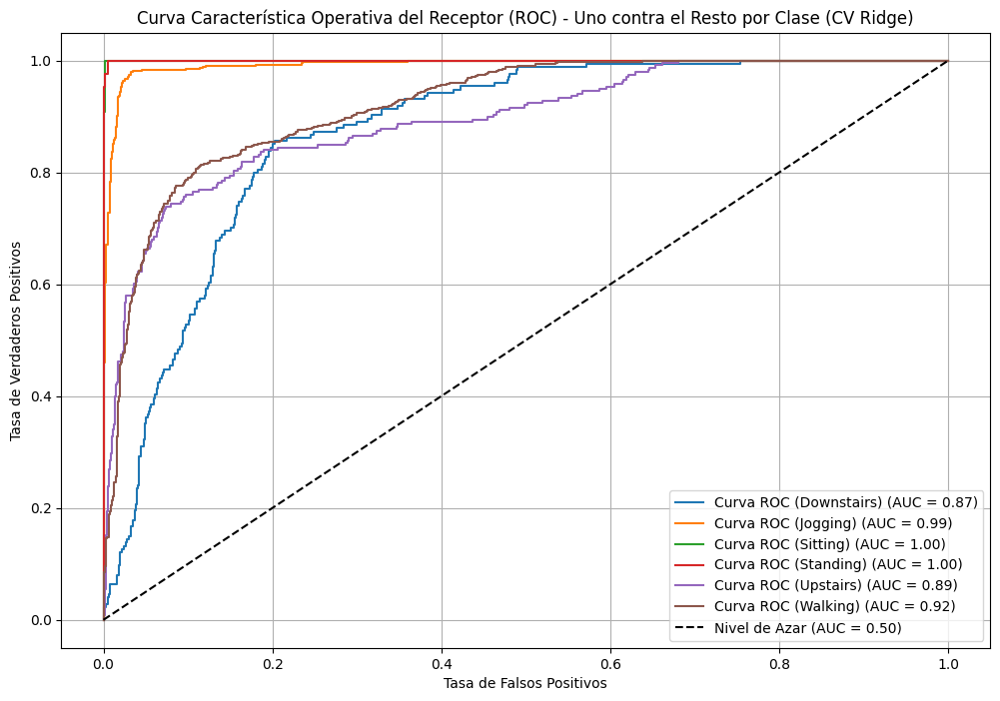

In [ ]:
# Obtener las clases únicas del modelo ajustado
classes_cvRidge = logit_cvRidge.classes_

# Binarizar las etiquetas verdaderas para un enfoque uno-contra-el-resto
y_test_binarized_cvRidge = label_binarize(y_test.values.ravel(), classes=classes_cvRidge)

# Obtener las probabilidades de predicción
y_pred_prob_cvRidge = logit_cvRidge.predict_proba(X_test)

plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes_cvRidge):
    # Calcular la curva ROC para cada clase
    fpr, tpr, _ = roc_curve(y_test_binarized_cvRidge[:, i], y_pred_prob_cvRidge[:, i])
    roc_auc_per_class = auc_function(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Curva ROC ({class_name}) (AUC = {roc_auc_per_class:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Nivel de Azar (AUC = 0.50)')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva Característica Operativa del Receptor (ROC) - Uno contra el Resto por Clase (CV Ridge)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


In [ ]:
#Función de pérdida Cross Entropy

y_test_flat = y_test.values.ravel()

cross_entropy_cvRidge = log_loss(y_test_flat, y_pred_prob_cvRidge)

print(f"Cross-Entropy función de pérdida de logit_cvRidge model: {cross_entropy_cvRidge:.4f}")

Cross-Entropy función de pérdida de logit_cvRidge model: 0.5597


In [ ]:
# Tomar los IDs de user_snippet desde metadata_kaggleRLogistica_limpia
ids = metadata_kaggleRLogistica_limpia['user_snippet']

# Definir X_predi a partir de metadata_kaggleRLogistica_limpia (excluyendo 'user_snippet')
X_predi = metadata_kaggleRLogistica_limpia.drop(columns=['user_snippet'])

# Generar predicciones usando el modelo 'pipe' (Regresión Logística sin penalización)
pred_kaggle = logit_cvRidge.predict(X_predi)

# Crear el DataFrame de resultados con los user_snippet y las predicciones
pred_df = pd.DataFrame({
    'user_snippet': ids,
    'activity': pred_kaggle
})

# Mostrar las primeras filas del DataFrame de predicciones
print("Primeras 5 predicciones de Regresión Logística con penalización Lasso para Kaggle:")
print(pred_df.head())

# Guardar las predicciones en un archivo CSV
pred_df.to_csv('predictions_IvHubMetrics.csv', index=False)
#print("Predicciones guardadas en 'predictions_IvHubMetrics.csv'")

# Modelo subido el 23/11/2025

Primeras 5 predicciones de Regresión Logística con penalización Lasso para Kaggle:
  user_snippet  activity
0       8054_0  Upstairs
1       8054_1   Sitting
2       8054_2   Walking
3       8054_3  Standing
4       8054_4  Upstairs


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegressionCV was fitted without feature names
  warnings.warn(


**`Ridge Cross Validation 5 K-Fold - F1`**

In [ ]:
logit_cvRidge = LogisticRegressionCV(
    penalty='l2',
    solver='lbfgs', # Método Newton utilizado cuando hay muchas clases
    cv=5, # 5 k-fold
    scoring='f1',
    max_iter=2000,
    multi_class='ovr'
)

logit_cvRidge.fit(X, y)


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1917: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegressionCV(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


LogisticRegressionCV(cv=5, max_iter=2000, multi_class='ovr', scoring='f1')

In [ ]:
X_kaggle = metadata_kaggleRLogistica_limpia.drop(columns=['user_snippet']).to_numpy()
pred_kaggle = logit_cvRidge.predict(X_kaggle)

In [ ]:
# Predecir en el conjunto de prueba usando el modelo logit_cvRidge
y_pred_cvRidge = logit_cvRidge.predict(X_test)

print("Evaluación del Modelo de Regresión Logística con Penalización Ridge y Cross-Validation")

# Matriz de Confusión
conf_matrix_cvRidge = confusion_matrix(y_test, y_pred_cvRidge)
print("\nMatriz de Confusión:")
print(conf_matrix_cvRidge)

# Reporte de Clasificación (incluye Precision, Recall, F1-score)
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_cvRidge))

# Métricas explícitas
accuracy_cvRidge = accuracy_score(y_test, y_pred_cvRidge)
precision_weighted_cvRidge = precision_score(y_test, y_pred_cvRidge, average='weighted')
recall_weighted_cvRidge = recall_score(y_test, y_pred_cvRidge, average='weighted')
f1_weighted_cvRidge = f1_score(y_test, y_pred_cvRidge, average='weighted')

print(f"\nAccuracy: {accuracy_cvRidge:.4f}")
print(f"Precision (Weighted): {precision_weighted_cvRidge:.4f}")
print(f"Recall (Weighted) / Sensibilidad: {recall_weighted_cvRidge:.4f}")
print(f"F1-Score (Weighted): {f1_weighted_cvRidge:.4f}")

# Calcular Especificidad (Specificity) para cada clase
classes_cvRidge = logit_cvRidge.classes_
print("\nEspecificidad (Specificity) por Clase:")
for i, class_label in enumerate(classes_cvRidge):
    true_negatives = conf_matrix_cvRidge.sum() - conf_matrix_cvRidge[i, :].sum() - conf_matrix_cvRidge[:, i].sum() + conf_matrix_cvRidge[i, i]
    false_positives = conf_matrix_cvRidge[:, i].sum() - conf_matrix_cvRidge[i, i]

    specificity = true_negatives / (true_negatives + false_positives) if (true_negatives + false_positives) > 0 else 0
    print(f"  {class_label}: {specificity:.4f}")

# Calcular AUC si es posible (requiere predict_proba)

try:
    y_pred_prob_cvRidge = logit_cvRidge.predict_proba(X_test)
    macro_auc_cvRidge = roc_auc_score(y_test.values.ravel(), y_pred_prob_cvRidge, multi_class='ovr', average='macro')
    print(f"\nAUC (macro) CV Ridge: {macro_auc_cvRidge:.4f}")
except Exception as e:
    print(f"\nCould not calculate AUC: {e}")

Evaluación del Modelo de Regresión Logística con Penalización Ridge y Cross-Validation

Matriz de Confusión:
[[ 20   1   0   0   7 146]
 [  0 676   0   0   1  12]
 [  1   0  21   0   0   0]
 [  0   0   5  32   3   3]
 [ 13  30   0   0  61 134]
 [ 40  32   0   0  12 684]]

Reporte de Clasificación:
              precision    recall  f1-score   support

  Downstairs       0.27      0.11      0.16       174
     Jogging       0.91      0.98      0.95       689
     Sitting       0.81      0.95      0.88        22
    Standing       1.00      0.74      0.85        43
    Upstairs       0.73      0.26      0.38       238
     Walking       0.70      0.89      0.78       768

    accuracy                           0.77      1934
   macro avg       0.74      0.66      0.67      1934
weighted avg       0.75      0.77      0.74      1934


Accuracy: 0.7725
Precision (Weighted): 0.7484
Recall (Weighted) / Sensibilidad: 0.7725
F1-Score (Weighted): 0.7383

Especificidad (Specificity) por Clase:
  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegressionCV was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegressionCV was fitted without feature names
  warnings.warn(


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegressionCV was fitted without feature names
  warnings.warn(


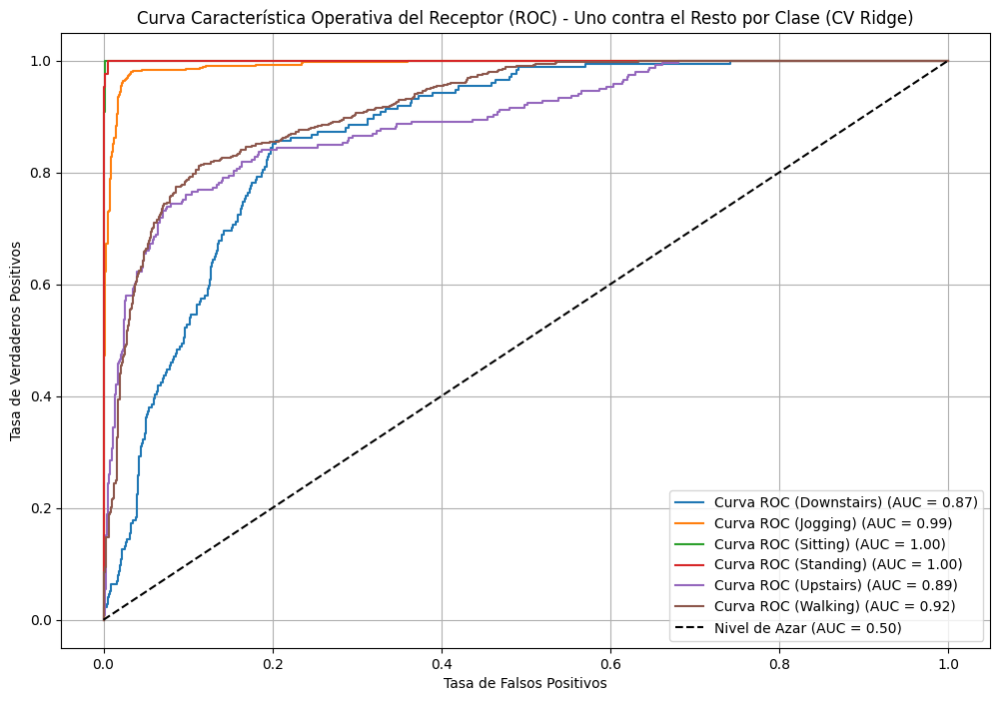

In [ ]:
# Obtener las clases únicas del modelo ajustado
classes_cvRidge = logit_cvRidge.classes_

# Binarizar las etiquetas verdaderas para un enfoque uno-contra-el-resto
y_test_binarized_cvRidge = label_binarize(y_test.values.ravel(), classes=classes_cvRidge)

# Obtener las probabilidades de predicción
y_pred_prob_cvRidge = logit_cvRidge.predict_proba(X_test)

plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes_cvRidge):
    # Calcular la curva ROC para cada clase
    fpr, tpr, _ = roc_curve(y_test_binarized_cvRidge[:, i], y_pred_prob_cvRidge[:, i])
    roc_auc_per_class = auc_function(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Curva ROC ({class_name}) (AUC = {roc_auc_per_class:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Nivel de Azar (AUC = 0.50)')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva Característica Operativa del Receptor (ROC) - Uno contra el Resto por Clase (CV Ridge)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


In [ ]:
#Función de pérdida Cross Entropy

y_test_flat = y_test.values.ravel()

cross_entropy_cvRidge = log_loss(y_test_flat, y_pred_prob_cvRidge)

print(f"Cross-Entropy función de pérdida de logit_cvRidge model: {cross_entropy_cvRidge:.4f}")

Cross-Entropy función de pérdida de logit_cvRidge model: 0.5602


In [ ]:
# Tomar los IDs de user_snippet desde metadata_kaggleRLogistica_limpia
ids = metadata_kaggleRLogistica_limpia['user_snippet']

# Definir X_predi a partir de metadata_kaggleRLogistica_limpia (excluyendo 'user_snippet')
X_predi = metadata_kaggleRLogistica_limpia.drop(columns=['user_snippet'])

# Generar predicciones usando el modelo 'pipe' (Regresión Logística sin penalización)
pred_kaggle = logit_cvRidge.predict(X_predi)

# Crear el DataFrame de resultados con los user_snippet y las predicciones
pred_df = pd.DataFrame({
    'user_snippet': ids,
    'activity': pred_kaggle
})

# Mostrar las primeras filas del DataFrame de predicciones
print("Primeras 5 predicciones de Regresión Logística con penalización Lasso para Kaggle:")
print(pred_df.head())

# Guardar las predicciones en un archivo CSV
pred_df.to_csv('predictions_IvHubMetrics.csv', index=False)
#print("Predicciones guardadas en 'predictions_IvHubMetrics.csv'")

# Modelo subido el 23/11/2025

Primeras 5 predicciones de Regresión Logística con penalización Lasso para Kaggle:
  user_snippet  activity
0       8054_0  Upstairs
1       8054_1   Sitting
2       8054_2   Walking
3       8054_3  Standing
4       8054_4  Upstairs


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegressionCV was fitted without feature names
  warnings.warn(


**`Ridge Cross Validation 5 K-Fold - AUC`**

In [ ]:
logit_cvRidge = LogisticRegressionCV(
    penalty='l2',
    solver='lbfgs', # Método Newton utilizado cuando hay muchas clases
    cv=5, # 5 k-fold
    scoring='roc_auc_ovr',
    max_iter=2000,
    multi_class='ovr'
)

logit_cvRidge.fit(X, y)


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1917: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegressionCV(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


LogisticRegressionCV(cv=5, max_iter=2000, multi_class='ovr',
                     scoring='roc_auc_ovr')

In [ ]:
X_kaggle = metadata_kaggleRLogistica_limpia.drop(columns=['user_snippet']).to_numpy()
pred_kaggle = logit_cvRidge.predict(X_kaggle)

In [ ]:
# Predecir en el conjunto de prueba usando el modelo logit_cvRidge
y_pred_cvRidge = logit_cvRidge.predict(X_test)

print("Evaluación del Modelo de Regresión Logística con Penalización Ridge y Cross-Validation")

# Matriz de Confusión
conf_matrix_cvRidge = confusion_matrix(y_test, y_pred_cvRidge)
print("\nMatriz de Confusión:")
print(conf_matrix_cvRidge)

# Reporte de Clasificación (incluye Precision, Recall, F1-score)
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_cvRidge))

# Métricas explícitas
accuracy_cvRidge = accuracy_score(y_test, y_pred_cvRidge)
precision_weighted_cvRidge = precision_score(y_test, y_pred_cvRidge, average='weighted')
recall_weighted_cvRidge = recall_score(y_test, y_pred_cvRidge, average='weighted')
f1_weighted_cvRidge = f1_score(y_test, y_pred_cvRidge, average='weighted')

print(f"\nAccuracy: {accuracy_cvRidge:.4f}")
print(f"Precision (Weighted): {precision_weighted_cvRidge:.4f}")
print(f"Recall (Weighted) / Sensibilidad: {recall_weighted_cvRidge:.4f}")
print(f"F1-Score (Weighted): {f1_weighted_cvRidge:.4f}")

# Calcular Especificidad (Specificity) para cada clase
classes_cvRidge = logit_cvRidge.classes_
print("\nEspecificidad (Specificity) por Clase:")
for i, class_label in enumerate(classes_cvRidge):
    true_negatives = conf_matrix_cvRidge.sum() - conf_matrix_cvRidge[i, :].sum() - conf_matrix_cvRidge[:, i].sum() + conf_matrix_cvRidge[i, i]
    false_positives = conf_matrix_cvRidge[:, i].sum() - conf_matrix_cvRidge[i, i]

    specificity = true_negatives / (true_negatives + false_positives) if (true_negatives + false_positives) > 0 else 0
    print(f"  {class_label}: {specificity:.4f}")

# Calcular AUC si es posible (requiere predict_proba)

try:
    y_pred_prob_cvRidge = logit_cvRidge.predict_proba(X_test)
    macro_auc_cvRidge = roc_auc_score(y_test.values.ravel(), y_pred_prob_cvRidge, multi_class='ovr', average='macro')
    print(f"\nAUC (macro) CV Ridge: {macro_auc_cvRidge:.4f}")
except Exception as e:
    print(f"\nCould not calculate AUC: {e}")

Evaluación del Modelo de Regresión Logística con Penalización Ridge y Cross-Validation

Matriz de Confusión:
[[ 21   1   0   0   7 145]
 [  0 676   0   0   1  12]
 [  1   0  21   0   0   0]
 [  0   0   4  37   1   1]
 [ 14  30   0   0  61 133]
 [ 40  32   0   0  12 684]]

Reporte de Clasificación:
              precision    recall  f1-score   support

  Downstairs       0.28      0.12      0.17       174
     Jogging       0.91      0.98      0.95       689
     Sitting       0.84      0.95      0.89        22
    Standing       1.00      0.86      0.93        43
    Upstairs       0.74      0.26      0.38       238
     Walking       0.70      0.89      0.78       768

    accuracy                           0.78      1934
   macro avg       0.75      0.68      0.68      1934
weighted avg       0.75      0.78      0.74      1934


Accuracy: 0.7756
Precision (Weighted): 0.7527
Recall (Weighted) / Sensibilidad: 0.7756
F1-Score (Weighted): 0.7417

Especificidad (Specificity) por Clase:
  

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegressionCV was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegressionCV was fitted without feature names
  warnings.warn(


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegressionCV was fitted without feature names
  warnings.warn(


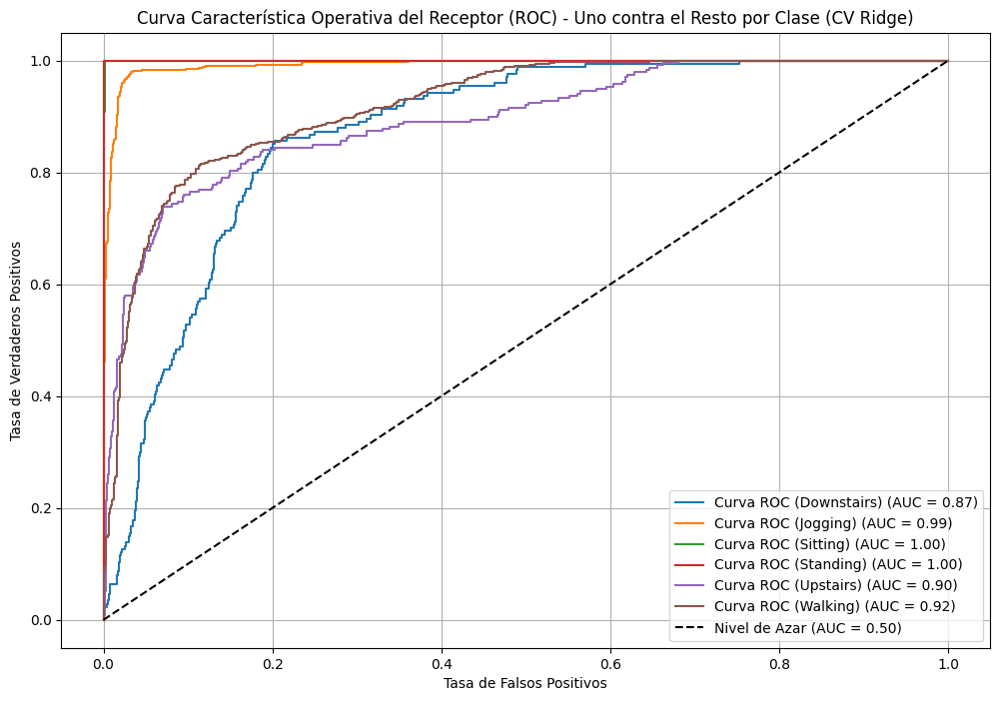

In [ ]:
# Obtener las clases únicas del modelo ajustado
classes_cvRidge = logit_cvRidge.classes_

# Binarizar las etiquetas verdaderas para un enfoque uno-contra-el-resto
y_test_binarized_cvRidge = label_binarize(y_test.values.ravel(), classes=classes_cvRidge)

# Obtener las probabilidades de predicción
y_pred_prob_cvRidge = logit_cvRidge.predict_proba(X_test)

plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes_cvRidge):
    # Calcular la curva ROC para cada clase
    fpr, tpr, _ = roc_curve(y_test_binarized_cvRidge[:, i], y_pred_prob_cvRidge[:, i])
    roc_auc_per_class = auc_function(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Curva ROC ({class_name}) (AUC = {roc_auc_per_class:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Nivel de Azar (AUC = 0.50)')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva Característica Operativa del Receptor (ROC) - Uno contra el Resto por Clase (CV Ridge)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


In [ ]:
#Función de pérdida Cross Entropy

y_test_flat = y_test.values.ravel()

cross_entropy_cvRidge = log_loss(y_test_flat, y_pred_prob_cvRidge)

print(f"Cross-Entropy función de pérdida de logit_cvRidge model: {cross_entropy_cvRidge:.4f}")

Cross-Entropy función de pérdida de logit_cvRidge model: 0.5556


In [ ]:
# Tomar los IDs de user_snippet desde metadata_kaggleRLogistica_limpia
ids = metadata_kaggleRLogistica_limpia['user_snippet']

# Definir X_predi a partir de metadata_kaggleRLogistica_limpia (excluyendo 'user_snippet')
X_predi = metadata_kaggleRLogistica_limpia.drop(columns=['user_snippet'])

# Generar predicciones usando el modelo 'pipe' (Regresión Logística sin penalización)
pred_kaggle = logit_cvRidge.predict(X_predi)

# Crear el DataFrame de resultados con los user_snippet y las predicciones
pred_df = pd.DataFrame({
    'user_snippet': ids,
    'activity': pred_kaggle
})

# Mostrar las primeras filas del DataFrame de predicciones
print("Primeras 5 predicciones de Regresión Logística con penalización Lasso para Kaggle:")
print(pred_df.head())

# Guardar las predicciones en un archivo CSV
pred_df.to_csv('predictions_IvHubMetrics.csv', index=False)
#print("Predicciones guardadas en 'predictions_IvHubMetrics.csv'")

# Modelo subido el 23/11/2025

Primeras 5 predicciones de Regresión Logística con penalización Lasso para Kaggle:
  user_snippet  activity
0       8054_0  Upstairs
1       8054_1   Sitting
2       8054_2   Walking
3       8054_3  Standing
4       8054_4  Upstairs


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegressionCV was fitted without feature names
  warnings.warn(


**`Lasso Cross Validation F1`**

In [ ]:
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Modelo de regresión logística con penalización L1 (LASSO)
logit_cv_lasso = LogisticRegressionCV(
    Cs=[0.14567, 5, 10],                    # pocos valores de C para que no se demore
    cv=5,                    # 5-fold CV
    penalty='l1',            # LASSO
    solver='saga',           # saga soporta l1 y multiclase
    multi_class='ovr',       # one-vs-rest para multiclase
    scoring='f1_macro',      # criterio de CV (puedes usar 'accuracy' si quieres)
    max_iter=1000,
    n_jobs=-1,               # usa todos los núcleos disponibles
    refit=True,              # se reentrena con el mejor C
    random_state=42
)

# Entrenamiento
logit_cv_lasso.fit(X_train, y_train)

# Predicción
y_pred_lasso = logit_cv_lasso.predict(X_test)

# Métricas básicas
print("Accuracy (LASSO):", accuracy_score(y_test, y_pred_lasso))
print("\nMatriz de confusión:")
print(confusion_matrix(y_test, y_pred_lasso))
print("\nReporte de clasificación:")
print(classification_report(y_test, y_pred_lasso))


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1917: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegressionCV(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr

Accuracy (LASSO): 0.7456049638055843

Matriz de confusión:
[[ 20   2   0   0   6 146]
 [  0 673   0   0   1  15]
 [  1   0  21   0   0   0]
 [  0   0  13  18   1  11]
 [ 12  31   0   0  41 154]
 [ 36  52   0   0  11 669]]

Reporte de clasificación:
              precision    recall  f1-score   support

  Downstairs       0.29      0.11      0.16       174
     Jogging       0.89      0.98      0.93       689
     Sitting       0.62      0.95      0.75        22
    Standing       1.00      0.42      0.59        43
    Upstairs       0.68      0.17      0.28       238
     Walking       0.67      0.87      0.76       768

    accuracy                           0.75      1934
   macro avg       0.69      0.58      0.58      1934
weighted avg       0.72      0.75      0.70      1934



In [ ]:
# Columnas de características: todo menos id y target
feature_cols = [col for col in metadata_limpia.columns
                if col not in ['user_snippet', 'activity']]

X_train = metadata_limpia[feature_cols]
y_train = metadata_limpia['activity']

X_test = metadata_test_limpia[feature_cols]
y_test = metadata_test_limpia['activity']


In [ ]:
# Tomar los IDs de user_snippet desde metadata_kaggleRLogistica_limpia
ids = metadata_kaggleRLogistica_limpia['user_snippet']

# Definir X_predi a partir de metadata_kaggleRLogistica_limpia (excluyendo 'user_snippet')
X_predi = metadata_kaggleRLogistica_limpia.drop(columns=['user_snippet'])

# Generar predicciones usando el modelo 'pipe' (Regresión Logística sin penalización)
pred_kaggle = logit_cv_lasso.predict(X_predi)

# Crear el DataFrame de resultados con los user_snippet y las predicciones
pred_df = pd.DataFrame({
    'user_snippet': ids,
    'activity': pred_kaggle
})

# Mostrar las primeras filas del DataFrame de predicciones
print("Primeras 5 predicciones de Regresión Logística con penalización Lasso para Kaggle:")
print(pred_df.head())

# Guardar las predicciones en un archivo CSV
pred_df.to_csv('predictions_IvHubMetrics.csv', index=False)
#print("Predicciones guardadas en 'predictions_IvHubMetrics.csv'")

# Modelo subido el 25/11/2025

Primeras 5 predicciones de Regresión Logística con penalización Lasso para Kaggle:
  user_snippet  activity
0       8054_0   Walking
1       8054_1   Sitting
2       8054_2   Walking
3       8054_3  Standing
4       8054_4   Walking


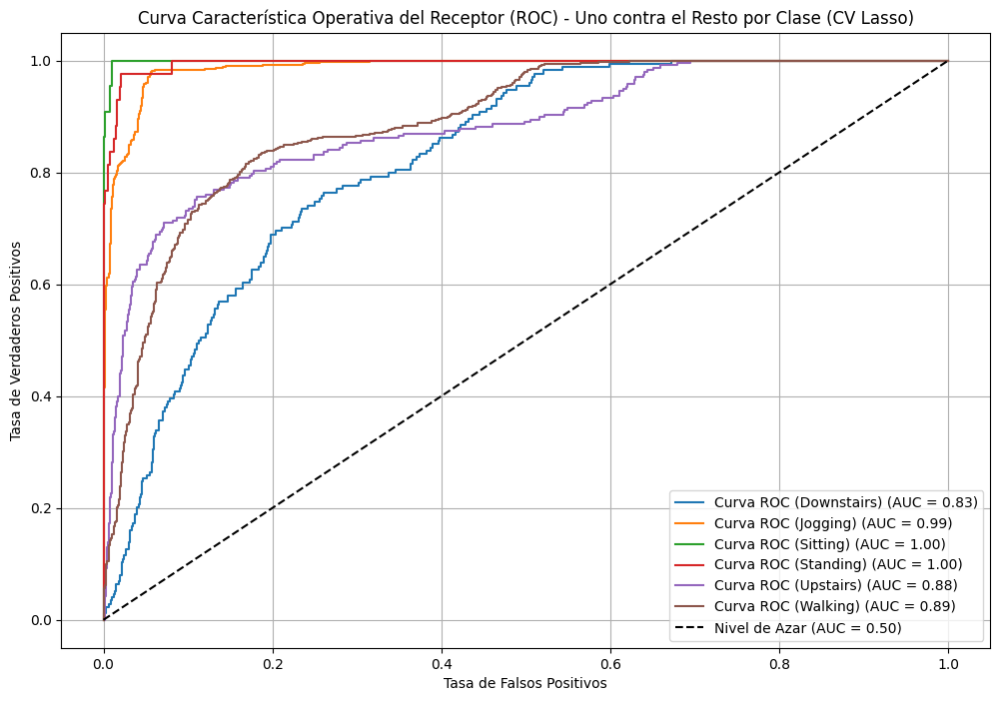

In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc as auc_function

# Obtener las clases únicas del modelo ajustado
classes_cv_lasso = logit_cv_lasso.classes_

# Binarizar las etiquetas verdaderas para un enfoque uno-contra-el-resto
y_test_binarized_cv_lasso = label_binarize(y_test.values.ravel(), classes=classes_cv_lasso)

# Obtener las probabilidades de predicción
y_pred_prob_cv_lasso = logit_cv_lasso.predict_proba(X_test)

plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes_cv_lasso):
    # Calcular la curva ROC para cada clase
    fpr, tpr, _ = roc_curve(y_test_binarized_cv_lasso[:, i], y_pred_prob_cv_lasso[:, i])
    roc_auc_per_class = auc_function(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Curva ROC ({class_name}) (AUC = {roc_auc_per_class:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Nivel de Azar (AUC = 0.50)')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva Característica Operativa del Receptor (ROC) - Uno contra el Resto por Clase (CV Lasso)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [ ]:
y_test_flat = y_test.values.ravel()
cross_entropy_cv_lasso = log_loss(y_test_flat, y_pred_prob_cv_lasso)
print(f"Cross-Entropy (función de pérdida) para Lasso CV: {cross_entropy_cv_lasso:.4f}")

Cross-Entropy (función de pérdida) para Lasso CV: 0.6644


**`Lasso Cross Validation Accuracy`**

In [ ]:
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Modelo de regresión logística con penalización L1 (LASSO)
logit_cv_lasso = LogisticRegressionCV(
    Cs=[0.14567, 5, 30],                    # pocos valores de C para que no se demore
    cv=5,                    # 5-fold CV
    penalty='l1',            # LASSO
    solver='saga',           # saga soporta l1 y multiclase
    multi_class='ovr',       # one-vs-rest para multiclase
    scoring='accuracy',      # criterio de CV (puedes usar 'accuracy' si quieres)
    max_iter=1000,
    n_jobs=-1,               # usa todos los núcleos disponibles
    refit=True,              # se reentrena con el mejor C
    random_state=42
)

# Entrenamiento
logit_cv_lasso.fit(X_train, y_train)

# Predicción
y_pred_lasso = logit_cv_lasso.predict(X_test)

# Métricas básicas
print("Accuracy (LASSO):", accuracy_score(y_test, y_pred_lasso))
print("\nMatriz de confusión:")
print(confusion_matrix(y_test, y_pred_lasso))
print("\nReporte de clasificación:")
print(classification_report(y_test, y_pred_lasso))

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1917: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegressionCV(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr

Accuracy (LASSO): 0.7456049638055843

Matriz de confusión:
[[ 20   2   0   0   6 146]
 [  0 673   0   0   1  15]
 [  1   0  21   0   0   0]
 [  0   0  13  18   1  11]
 [ 12  31   0   0  41 154]
 [ 36  52   0   0  11 669]]

Reporte de clasificación:
              precision    recall  f1-score   support

  Downstairs       0.29      0.11      0.16       174
     Jogging       0.89      0.98      0.93       689
     Sitting       0.62      0.95      0.75        22
    Standing       1.00      0.42      0.59        43
    Upstairs       0.68      0.17      0.28       238
     Walking       0.67      0.87      0.76       768

    accuracy                           0.75      1934
   macro avg       0.69      0.58      0.58      1934
weighted avg       0.72      0.75      0.70      1934



In [ ]:
# Columnas de características: todo menos id y target
colLassocvAccuracy = [col for col in metadata_limpia.columns
                if col not in ['user_snippet', 'activity']]

X_train = metadata_limpia[colLassocvAccuracy]
y_train = metadata_limpia['activity']

X_test = metadata_test_limpia[colLassocvAccuracy]
y_test = metadata_test_limpia['activity']


In [ ]:
# Tomar los IDs de user_snippet desde metadata_kaggleRLogistica_limpia
ids = metadata_kaggleRLogistica_limpia['user_snippet']

# Definir X_predi a partir de metadata_kaggleRLogistica_limpia (excluyendo 'user_snippet')
X_predi = metadata_kaggleRLogistica_limpia.drop(columns=['user_snippet'])

# Generar predicciones usando el modelo 'pipe' (Regresión Logística sin penalización)
pred_kaggle = logit_cv_lasso.predict(X_predi)

# Crear el DataFrame de resultados con los user_snippet y las predicciones
pred_df = pd.DataFrame({
    'user_snippet': ids,
    'activity': pred_kaggle
})

# Mostrar las primeras filas del DataFrame de predicciones
print("Primeras 5 predicciones de Regresión Logística con penalización Lasso para Kaggle:")
print(pred_df.head())

# Guardar las predicciones en un archivo CSV
pred_df.to_csv('predictions_IvHubMetrics.csv', index=False)
#print("Predicciones guardadas en 'predictions_IvHubMetrics.csv'")

# Modelo subido el 27/11/2025

Primeras 5 predicciones de Regresión Logística con penalización Lasso para Kaggle:
  user_snippet  activity
0       8054_0   Walking
1       8054_1   Sitting
2       8054_2   Walking
3       8054_3  Standing
4       8054_4   Walking


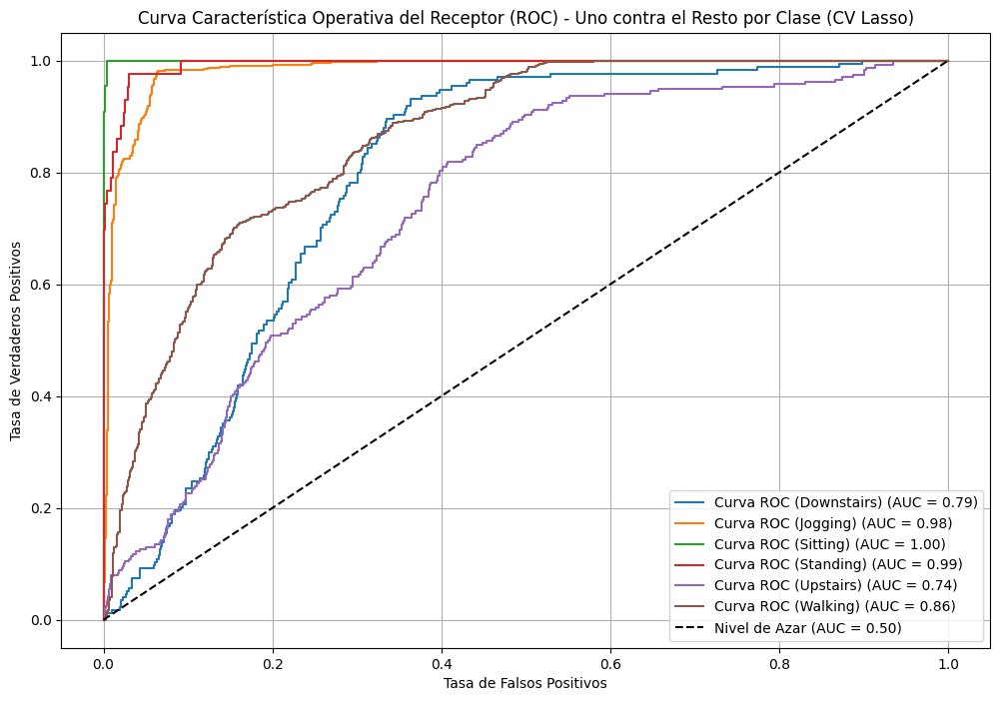

In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc as auc_function

# Obtener las clases únicas del modelo ajustado
classes_cv_lasso = logit_cv_lasso.classes_

# Binarizar las etiquetas verdaderas para un enfoque uno-contra-el-resto
y_test_binarized_cv_lasso = label_binarize(y_test.values.ravel(), classes=classes_cv_lasso)

# Obtener las probabilidades de predicción
y_pred_prob_cv_lasso = logit_cv_lasso.predict_proba(X_test)

plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes_cv_lasso):
    # Calcular la curva ROC para cada clase
    fpr, tpr, _ = roc_curve(y_test_binarized_cv_lasso[:, i], y_pred_prob_cv_lasso[:, i])
    roc_auc_per_class = auc_function(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Curva ROC ({class_name}) (AUC = {roc_auc_per_class:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Nivel de Azar (AUC = 0.50)')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva Característica Operativa del Receptor (ROC) - Uno contra el Resto por Clase (CV Lasso)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [ ]:
y_test_flat = y_test.values.ravel()
cross_entropy_cv_lasso = log_loss(y_test_flat, y_pred_prob_cv_lasso)
print(f"Cross-Entropy (función de pérdida) para Lasso CV: {cross_entropy_cv_lasso:.4f}")

Cross-Entropy (función de pérdida) para Lasso CV: 0.7756


### Por Análisis de componentes principales (PCA)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Librerías de Machine Learning
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix


# -----------------------------------------------------------------------------
# 2. ESTANDARIZACIÓN (OBLIGATORIO PARA PCA)
# -----------------------------------------------------------------------------
scaler = StandardScaler()

# Ajustamos el escalador solo con Train y transformamos ambos
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# -----------------------------------------------------------------------------
# 3. APLICAR PCA
# -----------------------------------------------------------------------------
# En lugar de adivinar el número de componentes, le decimos:
# "Quédate con los componentes necesarios para explicar el 95% de la varianza"
pca = PCA(n_components=0.95)

# Ajustamos PCA con los datos escalados de entrenamiento
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# ¿Cuántos componentes nos quedaron?
n_components = pca.n_components_
print(f"Original features: {X_train.shape[1]}")
print(f"Componentes PCA reducidos: {n_components}")
print(f"Reducción de dimensionalidad: {100 * (1 - n_components/X_train.shape[1]):.2f}%")


Original features: 21
Componentes PCA reducidos: 8
Reducción de dimensionalidad: 61.90%


In [ ]:

# -----------------------------------------------------------------------------
# 4. REGRESIÓN LOGÍSTICA (MULTICLASE)
# -----------------------------------------------------------------------------
# Usamos 'multinomial' para problemas de más de 2 clases
log_reg = LogisticRegression(
    multi_class='multinomial',
    solver='lbfgs',      # Buen solver para multiclass
    max_iter=1000,       # Aumentamos iteraciones para asegurar convergencia
    C=1.0                # Regularización (puedes ajustarla)
)

log_reg.fit(X_train_pca, y_train.values.ravel()) # .ravel() para asegurar formato 1D

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


LogisticRegression(max_iter=1000, multi_class='multinomial')


--- REPORTE DE CLASIFICACIÓN ---
              precision    recall  f1-score   support

  Downstairs       0.26      0.13      0.17       174
     Jogging       0.87      0.98      0.92       689
     Sitting       0.50      1.00      0.67        22
    Standing       1.00      0.44      0.61        43
    Upstairs       0.67      0.05      0.09       238
     Walking       0.69      0.89      0.77       768

    accuracy                           0.74      1934
   macro avg       0.66      0.58      0.54      1934
weighted avg       0.71      0.74      0.68      1934



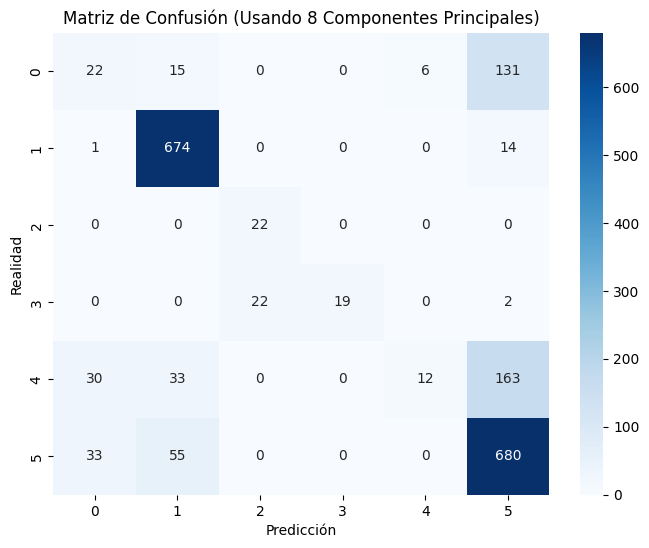

AUC (macro) PCA: 0.9199452466899855


In [ ]:

# -----------------------------------------------------------------------------
# 5. EVALUACIÓN
# -----------------------------------------------------------------------------
y_pred = log_reg.predict(X_test_pca)

print("\n--- REPORTE DE CLASIFICACIÓN ---")
print(classification_report(y_test, y_pred))

# Matriz de Confusión Visual
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.title(f'Matriz de Confusión (Usando {n_components} Componentes Principales)')
plt.xlabel('Predicción')
plt.ylabel('Realidad')
plt.show()

# Calcular AUC para el modelo PCA
# Convertir y_test a formato 1D para roc_auc_score
y_test_flat = y_test.values.ravel()
y_pred_prob_pca = log_reg.predict_proba(X_test_pca)
macro_auc_pca = roc_auc_score(y_test_flat, y_pred_prob_pca, multi_class='ovr', average='macro')
print("AUC (macro) PCA:", macro_auc_pca)

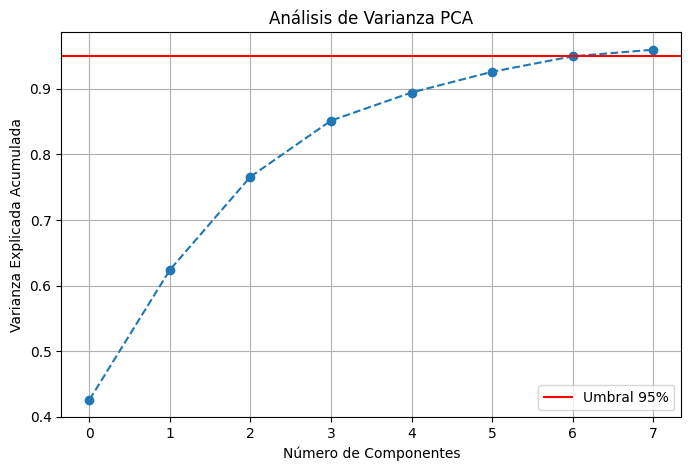

In [ ]:

# -----------------------------------------------------------------------------
# 6. (OPCIONAL) GRÁFICO DE VARIANZA ACUMULADA
# -----------------------------------------------------------------------------
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='--')
plt.xlabel('Número de Componentes')
plt.ylabel('Varianza Explicada Acumulada')
plt.title('Análisis de Varianza PCA')
plt.grid(True)
plt.axhline(y=0.95, color='r', linestyle='-', label='Umbral 95%')
plt.legend()
plt.show()

In [ ]:
accelekagle=metadata_kaggle
print(accelekagle.shape)
user_accelekagle = accelekagle['user_snippet']
accelekagle = accelekagle.drop(columns=['user_snippet'])
accelekagle.head()

(2506, 31)


,x-axis__sum_values,x-axis__median,x-axis__mean,x-axis__length,x-axis__standard_deviation,x-axis__variance,x-axis__root_mean_square,x-axis__maximum,x-axis__absolute_maximum,x-axis__minimum,y-axis__sum_values,y-axis__median,y-axis__mean,y-axis__length,y-axis__standard_deviation,y-axis__variance,y-axis__root_mean_square,y-axis__maximum,y-axis__absolute_maximum,y-axis__minimum,z-axis__sum_values,z-axis__median,z-axis__mean,z-axis__length,z-axis__standard_deviation,z-axis__variance,z-axis__root_mean_square,z-axis__maximum,z-axis__absolute_maximum,z-axis__minimum
0,880.46,8.560,8.8046,100.0,5.146708,26.488599,10.198509,19.53,19.53,-1.04,517.84,4.615,5.1784,100.0,3.806477,14.489265,6.426904,17.24,17.24,-2.49,-6.605867,-0.762740,-0.066059,100.0,3.058799,9.356253,3.059513,9.615966,9.615966,-9.152874
1,552.88,5.520,5.5288,100.0,0.039173,0.001535,5.528939,5.63,5.63,5.43,251.05,2.530,2.5105,100.0,0.028333,0.000803,2.510660,2.56,2.56,2.45,823.670000,8.240000,8.236700,100.0,0.037445,0.001402,8.236785,8.310000,8.310000,8.120000
2,848.84,8.045,8.4884,100.0,4.789062,22.935113,9.746181,19.57,19.57,-1.50,528.33,4.805,5.2833,100.0,3.656953,13.373308,6.425462,14.29,14.29,-2.79,-7.995144,-0.211115,-0.079951,100.0,3.178891,10.105348,3.179896,9.656827,9.656827,-7.014479
3,100.93,0.990,1.0093,100.0,0.044525,0.001983,1.010282,1.12,1.12,0.89,992.36,9.920,9.9236,100.0,0.020373,0.000415,9.923621,10.00,10.00,9.89,29.770000,0.310000,0.297700,100.0,0.032058,0.001028,0.299421,0.340000,0.340000,0.190000
4,845.52,7.970,8.4552,100.0,4.858636,23.606345,9.751756,19.57,19.57,-2.45,523.32,4.770,5.2332,100.0,3.628599,13.166734,6.368133,15.51,15.51,-2.83,1.757024,-0.483522,0.017570,100.0,3.475728,12.080686,3.475773,10.310603,10.310603,-9.956474


In [ ]:
predict_log_reg = log_reg.predict(accelekagle)

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(


ValueError: X has 30 features, but LogisticRegression is expecting 8 features as input.

In [ ]:
resultados = pd.DataFrame({
    'user_snippet': user_accelekagle,
    'prediction': predict_log_reg
})
resultados

NameError: name 'predict_log_reg' is not defined

## Support Vector Machine

In [ ]:
base = 'https://raw.githubusercontent.com/ivonnelinares10-prog/2025_II_MLAceleradores/main/'

metadata = pd.read_csv(base + 'metadata.csv')
metadata_kaggle = pd.read_csv(base + 'metadata_kaggle.csv')
metadata_test = pd.read_csv(base + 'metadata_test.csv')

In [ ]:
acceledata = metadata
y_train = acceledata[['activity']]
X_train = acceledata.iloc[:, range(1, 31)]
acceledata_test = metadata_test
y_test = acceledata_test[['activity']]
X_test = acceledata_test.iloc[:, range(1, 31)]

### Con train test pre definidos

Entrenando el modelo SVM...


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



--- Reporte de Clasificación ---
              precision    recall  f1-score   support

  Downstairs       0.29      0.39      0.34       174
     Jogging       0.95      0.98      0.97       689
     Sitting       0.51      1.00      0.68        22
    Standing       1.00      0.44      0.61        43
    Upstairs       0.57      0.50      0.53       238
     Walking       0.86      0.81      0.84       768

    accuracy                           0.79      1934
   macro avg       0.70      0.69      0.66      1934
weighted avg       0.81      0.79      0.79      1934



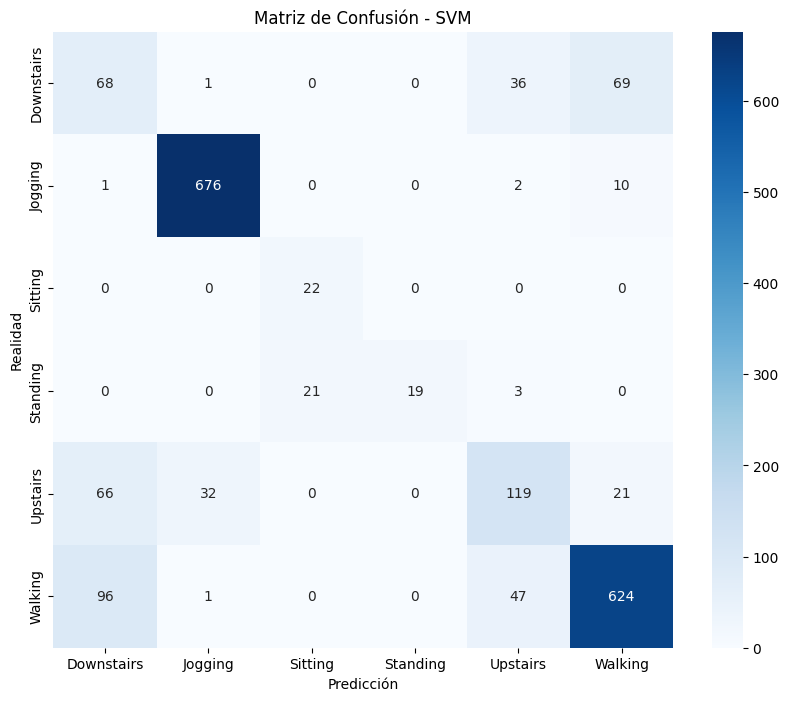

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# 1. PREPARACIÓN DE DATOS
# Asumimos que tu DataFrame se llama 'metadata'
# Eliminamos 'user_snippet' porque es un ID y no aporta al movimiento
# Eliminamos 'activity' de X porque es lo que queremos predecir

# X = metadata.drop(columns=['user_snippet', 'activity'])
# y = metadata['activity']

# 2. DIVISIÓN TRAIN/TEST
# Separamos el 30% de los datos para probar el modelo
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# 3. CREACIÓN DEL PIPELINE
# El SVM es sensible a la escala, por lo que StandardScaler es OBLIGATORIO.
# Usamos kernel='rbf' (Radial Basis Function) porque es excelente para capturar
# relaciones no lineales (la diferencia entre caminar y correr no es una línea recta).
# class_weight='balanced' es CRÍTICO para tus clases pequeñas (Sitting/Standing).

svm_pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Paso 1: Escalar los datos (Media 0, Var 1)
    ('svm', SVC(kernel='rbf', C=1.0, gamma='scale', class_weight='balanced', random_state=42)) # Paso 2: Modelo
])

# 4. ENTRENAMIENTO
print("Entrenando el modelo SVM...")
svm_pipeline.fit(X_train, y_train)

# 5. PREDICCIÓN
y_pred = svm_pipeline.predict(X_test)

# 6. EVALUACIÓN
print("\n--- Reporte de Clasificación ---")
print(classification_report(y_test, y_pred))

# Visualización de la Matriz de Confusión
plt.figure(figsize=(10, 8))
cm = confusion_matrix(y_test, y_pred, labels=svm_pipeline.classes_)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=svm_pipeline.classes_, yticklabels=svm_pipeline.classes_)
plt.xlabel('Predicción')
plt.ylabel('Realidad')
plt.title('Matriz de Confusión - SVM')
plt.show()

In [ ]:
accelekagle=metadata_kaggle
print(accelekagle.shape)
user_accelekagle = accelekagle['user_snippet']
accelekagle = accelekagle.drop(columns=['user_snippet'])
accelekagle.head()

(2506, 31)


,x-axis__sum_values,x-axis__median,x-axis__mean,x-axis__length,x-axis__standard_deviation,x-axis__variance,x-axis__root_mean_square,x-axis__maximum,x-axis__absolute_maximum,x-axis__minimum,y-axis__sum_values,y-axis__median,y-axis__mean,y-axis__length,y-axis__standard_deviation,y-axis__variance,y-axis__root_mean_square,y-axis__maximum,y-axis__absolute_maximum,y-axis__minimum,z-axis__sum_values,z-axis__median,z-axis__mean,z-axis__length,z-axis__standard_deviation,z-axis__variance,z-axis__root_mean_square,z-axis__maximum,z-axis__absolute_maximum,z-axis__minimum
0,880.46,8.560,8.8046,100.0,5.146708,26.488599,10.198509,19.53,19.53,-1.04,517.84,4.615,5.1784,100.0,3.806477,14.489265,6.426904,17.24,17.24,-2.49,-6.605867,-0.762740,-0.066059,100.0,3.058799,9.356253,3.059513,9.615966,9.615966,-9.152874
1,552.88,5.520,5.5288,100.0,0.039173,0.001535,5.528939,5.63,5.63,5.43,251.05,2.530,2.5105,100.0,0.028333,0.000803,2.510660,2.56,2.56,2.45,823.670000,8.240000,8.236700,100.0,0.037445,0.001402,8.236785,8.310000,8.310000,8.120000
2,848.84,8.045,8.4884,100.0,4.789062,22.935113,9.746181,19.57,19.57,-1.50,528.33,4.805,5.2833,100.0,3.656953,13.373308,6.425462,14.29,14.29,-2.79,-7.995144,-0.211115,-0.079951,100.0,3.178891,10.105348,3.179896,9.656827,9.656827,-7.014479
3,100.93,0.990,1.0093,100.0,0.044525,0.001983,1.010282,1.12,1.12,0.89,992.36,9.920,9.9236,100.0,0.020373,0.000415,9.923621,10.00,10.00,9.89,29.770000,0.310000,0.297700,100.0,0.032058,0.001028,0.299421,0.340000,0.340000,0.190000
4,845.52,7.970,8.4552,100.0,4.858636,23.606345,9.751756,19.57,19.57,-2.45,523.32,4.770,5.2332,100.0,3.628599,13.166734,6.368133,15.51,15.51,-2.83,1.757024,-0.483522,0.017570,100.0,3.475728,12.080686,3.475773,10.310603,10.310603,-9.956474


In [ ]:
predicciones_kaggle = svm_pipeline.predict(accelekagle)

In [ ]:
resultados = pd.DataFrame({
    'user_snippet': user_accelekagle,
    'prediction': predicciones_kaggle
})

In [ ]:
resultados.to_csv('submission_svm.csv', index=False)
#Ejecutado y puesot a prueba el 24 de noviembre de 2025 23:24

### Con train y test aleatorios

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

# 1. UNIFICAR LOS DATASETS
# Concatenamos el train original y el test original en uno solo
full_data = pd.concat([metadata, metadata_test], axis=0, ignore_index=True)

print(f"Tamaño total después de unir: {full_data.shape}")

# 2. DEFINIR X e Y
# Usamos la misma lógica que tenías, pero sobre el dataset completo.
# Asumiendo que la columna 0 es 'user_snippet' y 'activity' es la etiqueta.

# Opción segura usando nombres de columnas (Recomendado):
# Eliminamos el ID (user_snippet) y la etiqueta (activity) para obtener X
X = full_data.drop(columns=['user_snippet', 'activity'])
y = full_data['activity']

# 3. DIVISIÓN ALEATORIA Y ESTRATIFICADA
# test_size=0.3: Dejamos el 30% para test (puedes cambiarlo a 0.2 o 0.25)
# random_state=42: Para que el resultado sea reproducible
# shuffle=True: (Por defecto es True) Baraja los datos aleatoriamente
# stratify=y: ¡CRUCIAL! Asegura que si hay 10% de 'Standing' en el total,
#             haya 10% en train y 10% en test.

X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(
    X, y,
    test_size=0.3,
    random_state=42,
    shuffle=True,
    stratify=y
)

print(f"Nuevo tamaño de Train: {X_train_new.shape}")
print(f"Nuevo tamaño de Test: {X_test_new.shape}")

# 4. ENTRENAR EL MODELO CON LA NUEVA DIVISIÓN
# Reutilizamos tu pipeline de SVM
svm_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svm', SVC(kernel='rbf', C=1.0, gamma='scale', class_weight='balanced', random_state=42))
])

svm_pipeline.fit(X_train_new, y_train_new)

# 5. EVALUAR
y_pred_new = svm_pipeline.predict(X_test_new)

print("\n--- Nuevo Reporte de Clasificación (Datos Mezclados) ---")
print(classification_report(y_test_new, y_pred_new))

Tamaño total después de unir: (8244, 32)
Nuevo tamaño de Train: (5770, 30)
Nuevo tamaño de Test: (2474, 30)

--- Nuevo Reporte de Clasificación (Datos Mezclados) ---
              precision    recall  f1-score   support

  Downstairs       0.53      0.73      0.61       234
     Jogging       0.97      0.96      0.97       792
     Sitting       0.98      0.90      0.94       103
    Standing       0.92      0.97      0.94        97
    Upstairs       0.70      0.72      0.71       282
     Walking       0.96      0.87      0.92       966

    accuracy                           0.88      2474
   macro avg       0.84      0.86      0.85      2474
weighted avg       0.89      0.88      0.88      2474



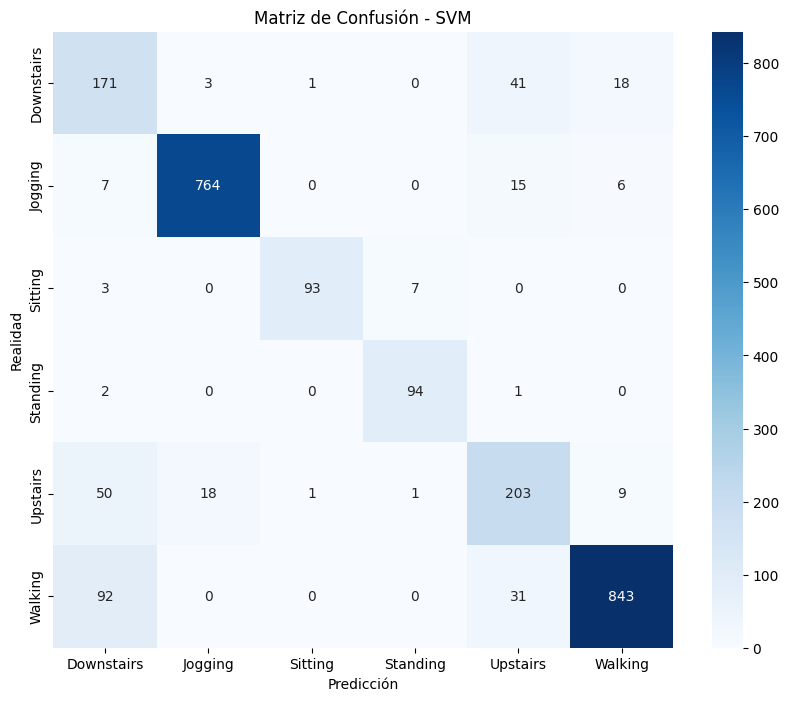

In [ ]:
plt.figure(figsize=(10, 8))
cm = confusion_matrix(y_test_new, y_pred_new, labels=svm_pipeline.classes_)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=svm_pipeline.classes_, yticklabels=svm_pipeline.classes_)
plt.xlabel('Predicción')
plt.ylabel('Realidad')
plt.title('Matriz de Confusión - SVM')
plt.show()

In [ ]:
accelekagle=metadata_kaggle
print(accelekagle.shape)
user_accelekagle = accelekagle['user_snippet']
accelekagle = accelekagle.drop(columns=['user_snippet'])
accelekagle.head()

(2506, 31)


,x-axis__sum_values,x-axis__median,x-axis__mean,x-axis__length,x-axis__standard_deviation,x-axis__variance,x-axis__root_mean_square,x-axis__maximum,x-axis__absolute_maximum,x-axis__minimum,y-axis__sum_values,y-axis__median,y-axis__mean,y-axis__length,y-axis__standard_deviation,y-axis__variance,y-axis__root_mean_square,y-axis__maximum,y-axis__absolute_maximum,y-axis__minimum,z-axis__sum_values,z-axis__median,z-axis__mean,z-axis__length,z-axis__standard_deviation,z-axis__variance,z-axis__root_mean_square,z-axis__maximum,z-axis__absolute_maximum,z-axis__minimum
0,880.46,8.560,8.8046,100.0,5.146708,26.488599,10.198509,19.53,19.53,-1.04,517.84,4.615,5.1784,100.0,3.806477,14.489265,6.426904,17.24,17.24,-2.49,-6.605867,-0.762740,-0.066059,100.0,3.058799,9.356253,3.059513,9.615966,9.615966,-9.152874
1,552.88,5.520,5.5288,100.0,0.039173,0.001535,5.528939,5.63,5.63,5.43,251.05,2.530,2.5105,100.0,0.028333,0.000803,2.510660,2.56,2.56,2.45,823.670000,8.240000,8.236700,100.0,0.037445,0.001402,8.236785,8.310000,8.310000,8.120000
2,848.84,8.045,8.4884,100.0,4.789062,22.935113,9.746181,19.57,19.57,-1.50,528.33,4.805,5.2833,100.0,3.656953,13.373308,6.425462,14.29,14.29,-2.79,-7.995144,-0.211115,-0.079951,100.0,3.178891,10.105348,3.179896,9.656827,9.656827,-7.014479
3,100.93,0.990,1.0093,100.0,0.044525,0.001983,1.010282,1.12,1.12,0.89,992.36,9.920,9.9236,100.0,0.020373,0.000415,9.923621,10.00,10.00,9.89,29.770000,0.310000,0.297700,100.0,0.032058,0.001028,0.299421,0.340000,0.340000,0.190000
4,845.52,7.970,8.4552,100.0,4.858636,23.606345,9.751756,19.57,19.57,-2.45,523.32,4.770,5.2332,100.0,3.628599,13.166734,6.368133,15.51,15.51,-2.83,1.757024,-0.483522,0.017570,100.0,3.475728,12.080686,3.475773,10.310603,10.310603,-9.956474


In [ ]:
predicciones_kaggle = svm_pipeline.predict(accelekagle)
resultados = pd.DataFrame({
    'user_snippet': user_accelekagle,
    'prediction': predicciones_kaggle
})
resultados.to_csv('submission_svm.csv', index=False)

In [ ]:
from sklearn.metrics import hinge_loss
from sklearn.preprocessing import label_binarize
import numpy as np

# Obtener las clases únicas del modelo SVM desde el pipeline
# Usamos svm_pipeline.named_steps['svm'].classes_ para asegurar que obtenemos las clases del estimador final del pipeline
classes_svm = svm_pipeline.named_steps['svm'].classes_

# Binarizar las etiquetas verdaderas (y_test_new) para un enfoque uno-contra-el-resto
# Esto es necesario para calcular la Hinge Loss en un contexto multiclase, donde se evalúa cada clase contra el resto.
y_test_binarized_svm = label_binarize(y_test_new.values.ravel(), classes=classes_svm)

# Obtener las puntuaciones de decisión del SVM
# Estas puntuaciones (`decision_function`) representan la distancia de cada muestra al hiperplano de decisión para cada clase.
decision_scores_svm = svm_pipeline.decision_function(X_test_new)

# La función `hinge_loss` de sklearn espera etiquetas verdaderas en formato -1 o 1 para un problema binario.
# Para adaptarlo al contexto multiclase (One-vs-Rest), convertimos las etiquetas binarizadas a -1/1.
y_test_hinge_format = np.where(y_test_binarized_svm == 1, 1, -1)

# Calculamos la Hinge Loss para cada clase individualmente y luego promediamos
per_class_hinge_loss = []
print("Hinge Loss por clase (en el contexto One-vs-Rest):")
for i, class_name in enumerate(classes_svm):
    # Calculamos la Hinge Loss para la clase actual vs. el resto
    loss = hinge_loss(y_test_hinge_format[:, i], decision_scores_svm[:, i])
    per_class_hinge_loss.append(loss)
    print(f"  Clase '{class_name}': {loss:.4f}")

# Calculamos la Hinge Loss promedio sobre todas las clases
mean_hinge_loss = np.mean(per_class_hinge_loss)
print(f"\nHinge Loss promedio (One-vs-Rest) para el modelo SVM: {mean_hinge_loss:.4f}")

Hinge Loss por clase (en el contexto One-vs-Rest):
  Clase 'Downstairs': 3.9177
  Clase 'Jogging': 1.7534
  Clase 'Sitting': 1.6763
  Clase 'Standing': 1.1571
  Clase 'Upstairs': 4.1525
  Clase 'Walking': 2.0994

Hinge Loss promedio (One-vs-Rest) para el modelo SVM: 2.4594


### Análisis de componentes principales

In [ ]:
from sklearn.decomposition import PCA

# Creamos un nuevo Pipeline que incluye PCA en el medio
svm_pca_pipeline = Pipeline([
    # PASO 1: Escalar (Fundamental antes de PCA)
    ('scaler', StandardScaler()),

    # PASO 2: PCA
    # n_components=0.95: "Quédate con los componentes necesarios
    # para explicar el 95% de la varianza original".
    # (El sistema decidirá si son 10, 15 o 20 componentes automáticamente)
    ('pca', PCA(n_components=0.95, random_state=42)),

    # PASO 3: Tu modelo SVM (Manteniendo tu configuración exitosa)
    ('svm', SVC(kernel='rbf', C=1.0, gamma='scale', class_weight='balanced', random_state=42))
])

# Entrenar
print("Entrenando SVM con PCA...")
svm_pca_pipeline.fit(X_train_new, y_train_new)

# Evaluar
print("Evaluando...")
y_pred_pca = svm_pca_pipeline.predict(X_test_new)

print("\n--- Reporte con PCA ---")
print(classification_report(y_test_new, y_pred_pca))

# ¿Cuántos componentes usó al final?
n_components_used = svm_pca_pipeline.named_steps['pca'].n_components_
print(f"PCA redujo tus 30 variables a solo {n_components_used} componentes principales.")

Entrenando SVM con PCA...
Evaluando...

--- Reporte con PCA ---
              precision    recall  f1-score   support

  Downstairs       0.47      0.58      0.52       234
     Jogging       0.96      0.96      0.96       792
     Sitting       0.99      0.90      0.94       103
    Standing       0.92      0.96      0.94        97
    Upstairs       0.53      0.55      0.54       282
     Walking       0.91      0.86      0.89       966

    accuracy                           0.84      2474
   macro avg       0.80      0.80      0.80      2474
weighted avg       0.85      0.84      0.84      2474

PCA redujo tus 30 variables a solo 8 componentes principales.


In [ ]:
# 1. Cargar la nueva base (si no está cargada)
# metadata_kaggle = pd.read_csv('ruta/a/metadata_kaggle.csv')

# 2. PREPARACIÓN (Limpieza)
# Guardamos los IDs para el final
ids_nuevos = metadata_kaggle['user_snippet']

# Creamos X_nueva eliminando lo que no son features numéricos
# IMPORTANTE: Debes borrar exactamente las mismas columnas que borraste al entrenar
columnas_a_borrar = ['user_snippet']

# Si la nueva base tiene la columna 'activity' (aunque esté vacía o sea para validar), bórrala
if 'activity' in metadata_kaggle.columns:
    columnas_a_borrar.append('activity')

X_nueva = metadata_kaggle.drop(columns=columnas_a_borrar)

# 3. VERIFICACIÓN DE ORDEN (Buena práctica)
# Aseguramos que las columnas estén en el mismo orden que X_train
# (El modelo es ciego, si le das la columna 1 cambiada por la 2, fallará)
cols_entrenamiento = X_train_new.columns
X_nueva = X_nueva[cols_entrenamiento]

# 4. PREDICCIÓN
# El pipeline hará esto automáticamente:
#   a. StandardScaler: Usará la media/desviación de X_train para escalar X_nueva
#   b. PCA: Usará los vectores propios (eigenvectors) de X_train para transformar X_nueva
#   c. SVM: Usará el hiperplano aprendido para clasificar.
print("Generando predicciones con el modelo SVM + PCA...")
predicciones_nuevas = svm_pca_pipeline.predict(X_nueva)

# 5. RESULTADOS
df_resultados = pd.DataFrame({
    'user_snippet': ids_nuevos,
    'prediction': predicciones_nuevas
})

print(df_resultados.head())

# Guardar
df_resultados.to_csv('resultados_svm_pca.csv', index=False)

Generando predicciones con el modelo SVM + PCA...
  user_snippet  prediction
0       8054_0     Walking
1       8054_1     Sitting
2       8054_2  Downstairs
3       8054_3    Standing
4       8054_4     Walking


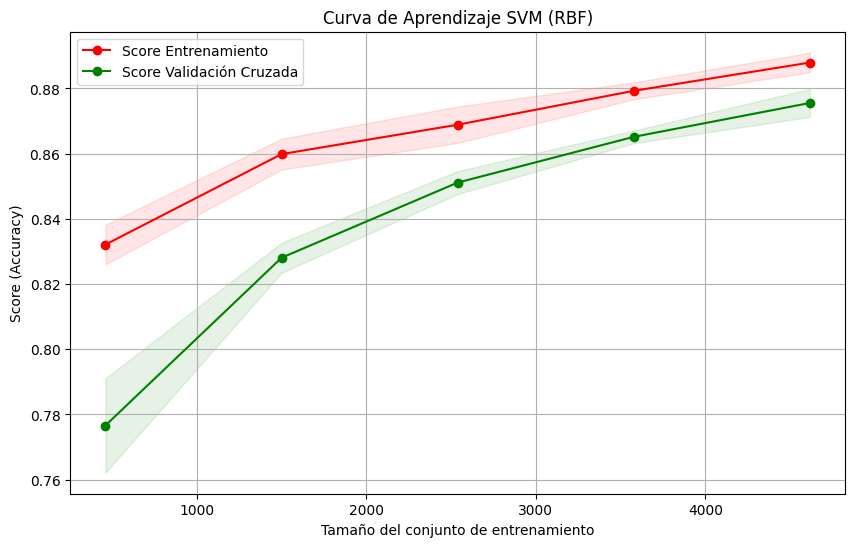

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve

def plot_learning_curve(estimator, title, X, y, cv=5):
    """
    Genera una gráfica de curva de aprendizaje.
    estimator: Tu pipeline (svm_pipeline)
    title: Título de la gráfica
    X, y: Tus datos completos (X_train_new, y_train_new)
    cv: Número de pliegues para validación cruzada
    """
    plt.figure(figsize=(10, 6))
    plt.title(title)
    plt.xlabel("Tamaño del conjunto de entrenamiento")
    plt.ylabel("Score (Accuracy)")

    # Generamos los datos de la curva
    # train_sizes: define 5 puntos progresivos (del 10% al 100% de los datos)
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=-1,
        train_sizes=np.linspace(0.1, 1.0, 5),
        scoring='accuracy' # O 'f1_macro' si prefieres
    )

    # Calculamos medias y desviaciones estándar para las sombras
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.grid()

    # Rellenar el área de varianza
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")

    # Pintar las líneas principales
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Score Entrenamiento")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Score Validación Cruzada")

    plt.legend(loc="best")
    return plt

# --- EJECUTAR EL ANÁLISIS ---
# Usamos tu pipeline ya definido y tus datos de entrenamiento
# Nota: Esto puede tardar un poco porque entrena el modelo 5 veces por cada punto.
plot_learning_curve(svm_pipeline, "Curva de Aprendizaje SVM (RBF)", X_train_new, y_train_new, cv=5)
plt.show()